In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import plotly.express as px

In [2]:
# Load the Excel file containing carbon emissions data from 1970 to 2023
excel_file = r'D:\Carbon_emisions_from_1970_to_2023.xlsx'  # Using 'r' to ensure backslashes are treated as literal characters
xls = pd.ExcelFile(excel_file)

In [16]:
# Retrieve and list all sheet names from the Excel file
sheet_names = xls.sheet_names
print("Available sheets:", sheet_names)

Available sheets: ['info', 'citations and references', 'GHG_totals_by_country', 'Shipping_and_aviation', 'GHG_by_sector_and_country', 'GHG_per_GDP_by_country', 'GHG_per_capita_by_country', 'LULUCF_macroregions']


In [8]:
# Load a specific sheet from the Excel file
# Replace 'GHG_totals_by_country' with the desired sheet name, e.g., 'Carbon Emissions'
sheet_name = 'GHG_totals_by_country'  # Specify the sheet name to load
df = pd.read_excel(excel_file, sheet_name=sheet_name)

In [9]:
# Display the DataFrame info
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 208 entries, 0 to 207
Data columns (total 57 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   EDGAR Country Code  208 non-null    object 
 1   Country             208 non-null    object 
 2   Continent           208 non-null    object 
 3   1970                208 non-null    float64
 4   1971                208 non-null    float64
 5   1972                208 non-null    float64
 6   1973                208 non-null    float64
 7   1974                208 non-null    float64
 8   1975                208 non-null    float64
 9   1976                208 non-null    float64
 10  1977                208 non-null    float64
 11  1978                208 non-null    float64
 12  1979                208 non-null    float64
 13  1980                208 non-null    float64
 14  1981                208 non-null    float64
 15  1982                208 non-null    float64
 16  1983    

In [10]:
# Remove rows with any missing values to create a cleaned DataFrame
df_cleaned = df.dropna()

# Alternatively, fill in missing values with the mean of each column
# Uncomment the line below to use this approach instead
# df_ghg_totals_cleaned = df_ghg_totals.fillna(df_ghg_totals.mean())

In [11]:
# Check for missing values again
missing_values_after_cleaning = df_cleaned.isnull().sum()
print("Missing values after cleaning:\n", missing_values_after_cleaning)

Missing values after cleaning:
 EDGAR Country Code    0
Country               0
Continent             0
1970                  0
1971                  0
1972                  0
1973                  0
1974                  0
1975                  0
1976                  0
1977                  0
1978                  0
1979                  0
1980                  0
1981                  0
1982                  0
1983                  0
1984                  0
1985                  0
1986                  0
1987                  0
1988                  0
1989                  0
1990                  0
1991                  0
1992                  0
1993                  0
1994                  0
1995                  0
1996                  0
1997                  0
1998                  0
1999                  0
2000                  0
2001                  0
2002                  0
2003                  0
2004                  0
2005                  0
2006                  0
2007    

In [12]:
# Display the DataFrame info
print(df_cleaned.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 208 entries, 0 to 207
Data columns (total 57 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   EDGAR Country Code  208 non-null    object 
 1   Country             208 non-null    object 
 2   Continent           208 non-null    object 
 3   1970                208 non-null    float64
 4   1971                208 non-null    float64
 5   1972                208 non-null    float64
 6   1973                208 non-null    float64
 7   1974                208 non-null    float64
 8   1975                208 non-null    float64
 9   1976                208 non-null    float64
 10  1977                208 non-null    float64
 11  1978                208 non-null    float64
 12  1979                208 non-null    float64
 13  1980                208 non-null    float64
 14  1981                208 non-null    float64
 15  1982                208 non-null    float64
 16  1983    

In [13]:
# Get summary statistics
summary_stats = df_cleaned.describe()
print("Summary Statistics:\n", summary_stats)

Summary Statistics:
               1970         1971         1972         1973         1974  \
count   208.000000   208.000000   208.000000   208.000000   208.000000   
mean    112.761560   112.981123   117.283698   122.972533   123.119859   
std     463.779847   457.675057   477.740690   495.034046   486.410004   
min       0.003355     0.003396     0.003534     0.003411     0.003694   
25%       1.871299     1.836798     1.900204     1.891076     1.961911   
50%      12.370600    12.326231    12.731914    12.866610    14.252589   
75%      57.297425    57.401003    59.922659    60.472605    61.019873   
max    5788.649393  5661.560738  5930.782898  6128.985919  5949.054788   

              1975         1976         1977         1978         1979  ...  \
count   208.000000   208.000000   208.000000   208.000000   208.000000  ...   
mean    123.335156   128.704602   131.833134   135.176608   138.403957  ...   
std     478.505618   501.505468   515.603830   523.561635   530.754868  ...

In [14]:
# Select only numeric columns from the cleaned DataFrame for correlation analysis
numeric_cols = df_cleaned.select_dtypes(include=['float64', 'int64'])

# Calculate the correlation matrix for the selected numeric columns and print it
correlation_matrix = numeric_cols.corr()
print("Correlation Matrix:\n", correlation_matrix)

Correlation Matrix:
           1970      1971      1972      1973      1974      1975      1976  \
1970  1.000000  0.999848  0.999791  0.999578  0.998660  0.996442  0.996936   
1971  0.999848  1.000000  0.999899  0.999716  0.999152  0.997552  0.997902   
1972  0.999791  0.999899  1.000000  0.999863  0.999353  0.997609  0.998057   
1973  0.999578  0.999716  0.999863  1.000000  0.999630  0.997748  0.998237   
1974  0.998660  0.999152  0.999353  0.999630  1.000000  0.998984  0.999327   
1975  0.996442  0.997552  0.997609  0.997748  0.998984  1.000000  0.999859   
1976  0.996936  0.997902  0.998057  0.998237  0.999327  0.999859  1.000000   
1977  0.996213  0.997306  0.997487  0.997564  0.998764  0.999805  0.999835   
1978  0.993730  0.995249  0.995362  0.995414  0.997184  0.999382  0.999155   
1979  0.993483  0.995066  0.995122  0.995222  0.997054  0.999254  0.999017   
1980  0.990645  0.992517  0.992603  0.992762  0.995228  0.998280  0.997876   
1981  0.990089  0.991942  0.992035  0.99209

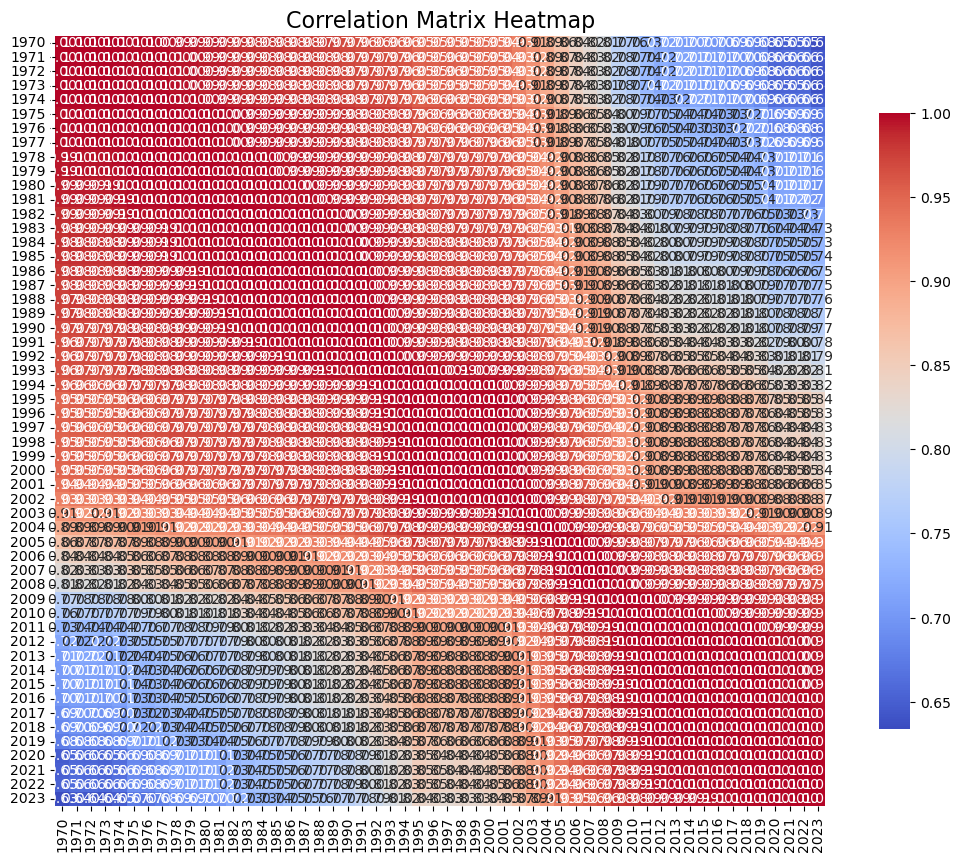

In [15]:
# Set the size of the heatmap for better visibility
plt.figure(figsize=(14, 10))

# Create a heatmap of the correlation matrix with annotations
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', square=True, cbar_kws={"shrink": .8})

# Set the title of the heatmap for context
plt.title('Correlation Matrix Heatmap', fontsize=16)

# Display the heatmap
plt.show()

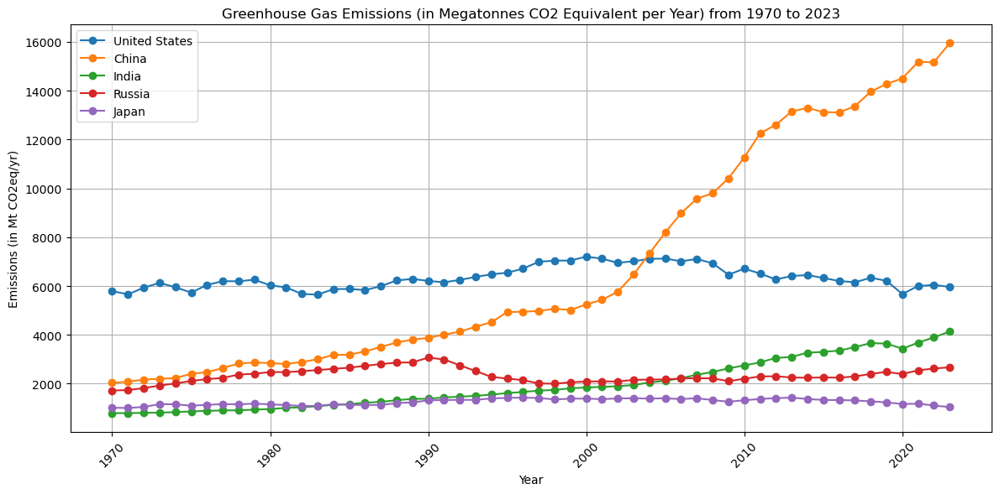

In [16]:
# Define a list of countries to analyze emissions data
countries = ['United States', 'China', 'India', 'Russia', 'Japan']  # Update these names based on your DataFrame

# Create a new plot for visualizing emissions data
plt.figure(figsize=(12, 6))

# Loop through each country to plot their greenhouse gas emissions over the years
for country in countries:
    # Extract emissions data for the specified country, selecting the years from 1970 onwards
    emissions = df_cleaned.loc[df_cleaned['Country'] == country].iloc[:, 3:57].T  # Transpose for better plotting
    plt.plot(emissions.index, emissions.values, marker='o', label=country)

# Customize the plot with title and axis labels
plt.title('Greenhouse Gas Emissions (in Megatonnes CO2 Equivalent per Year) from 1970 to 2023')
plt.xlabel('Year')
plt.ylabel('Emissions (in Mt CO2eq/yr)')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.legend()  # Show legend for country lines
plt.grid()  # Add grid for better visualization
plt.tight_layout()  # Adjust layout to prevent overlap
plt.show() 

In [18]:
# Calculate total emissions per country
total_emissions_per_country = df_cleaned.iloc[:, 3:57].sum(axis=1)  # Sums along columns for each year
df_cleaned['Total_Emissions'] = total_emissions_per_country
df_cleaned

,EDGAR Country Code,Country,Continent,1970,1971,1972,1973,1974,1975,1976,...,2015,2016,2017,2018,2019,2020,2021,2022,2023,Total_Emissions
0,ABW,Aruba,North America,0.036713,0.041538,0.052391,0.057360,0.056630,0.070743,0.069793,...,0.490990,0.514539,0.496141,0.495532,0.588998,0.482160,0.531202,0.533603,0.561498,16.288465
1,AFG,Afghanistan,Asia,15.437430,15.364077,13.316628,13.934875,15.177862,15.843058,15.943325,...,27.408332,26.633999,27.691927,27.553282,26.982777,26.646320,27.643074,28.614071,29.460052,976.936097
2,AGO,Angola,Africa,18.998763,18.866057,21.459002,23.018941,23.685423,22.519608,18.586243,...,81.775031,78.875889,73.424409,69.504638,69.910832,61.680081,64.408994,67.210842,67.700756,2644.311690
3,AIA,Anguilla,North America,0.003355,0.003396,0.003534,0.003411,0.003694,0.003968,0.003833,...,0.031334,0.031728,0.032476,0.031594,0.030948,0.026037,0.025224,0.025068,0.026211,0.824490
4,ALB,Albania,Europe,8.224850,8.170885,9.104799,8.585434,8.854280,9.033384,9.644184,...,8.739935,8.356522,9.164059,9.152843,8.618593,7.967356,8.395251,7.812022,7.673672,491.961385
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
203,WSM,Samoa,Oceania,0.157804,0.158061,0.162919,0.178156,0.201811,0.189211,0.190172,...,0.565776,0.572071,0.568273,0.548016,0.570495,0.565562,0.617131,0.635670,0.646144,19.229214
204,YEM,Yemen,Asia,5.397884,5.694599,5.955398,6.260079,6.483728,6.502045,6.816709,...,31.425993,27.158584,28.836472,31.936295,33.620228,32.878086,33.430707,33.175042,32.242872,1365.565354
205,ZAF,South Africa,Africa,241.122287,240.628058,247.926802,267.008805,276.088222,294.291848,310.314306,...,583.292557,583.291494,595.317587,598.069377,602.850939,541.709644,550.984438,533.026896,522.115491,23977.339127
206,ZMB,Zambia,Africa,12.463517,12.718537,13.299005,13.759407,13.976796,14.269532,14.699720,...,23.615690,24.219765,25.930251,27.255061,26.824978,27.344120,28.249100,29.845830,30.484449,943.164536


In [19]:
# Calculate the grand total of all emissions from the 'Total_Emissions' column
grand_total_emissions = df_cleaned['Total_Emissions'].sum()

# Create a new column to calculate the average percentage of total emissions for each country
df_cleaned['Average Percentage (%)'] = ((df_cleaned['Total_Emissions'] / grand_total_emissions) * 100).round(3)

# Display the updated DataFrame with country names, total emissions, and average percentage
print(df_cleaned[['Country', 'Total_Emissions', 'Average Percentage (%)']])
print("Mt CO2eq/yr: Megatonnes of Carbon Dioxide Equivalent per Year")

          Country  Total_Emissions  Average Percentage (%)
0           Aruba        16.288465                   0.001
1     Afghanistan       976.936097                   0.050
2          Angola      2644.311690                   0.135
3        Anguilla         0.824490                   0.000
4         Albania       491.961385                   0.025
..            ...              ...                     ...
203         Samoa        19.229214                   0.001
204         Yemen      1365.565354                   0.070
205  South Africa     23977.339127                   1.228
206        Zambia       943.164536                   0.048
207      Zimbabwe      1493.844777                   0.076

[208 rows x 3 columns]
Mt CO2eq/yr: Megatonnes of Carbon Dioxide Equivalent per Year


In [20]:
# Sort the DataFrame by 'Total Emissions' in descending order to identify the top 10 emitters
top_10_emissions = df_cleaned.sort_values(by='Total_Emissions', ascending=False).head(10)

# Reset the index of the sorted DataFrame and drop the old index for a cleaner output
top_10_emissions = top_10_emissions.reset_index(drop=True)

# Print the DataFrame showing the top 10 countries along with their total emissions and average percentage, without displaying the default index
print(top_10_emissions[['Country', 'Total_Emissions', 'Average Percentage (%)']].to_string(index=False))
print("\nMt CO2eq/yr: Megatonnes of Carbon Dioxide Equivalent per Year")

       Country  Total_Emissions  Average Percentage (%)
         China    370328.794879                  18.961
 United States    342349.275907                  17.529
        Russia    125898.963227                   6.446
         India    105116.798895                   5.382
         Japan     67956.478153                   3.479
       Germany     59944.943775                   3.069
        Brazil     45628.510283                   2.336
United Kingdom     36646.490157                   1.876
        Canada     35006.516061                   1.792
       Ukraine     31424.825152                   1.609

Mt CO2eq/yr: Megatonnes of Carbon Dioxide Equivalent per Year


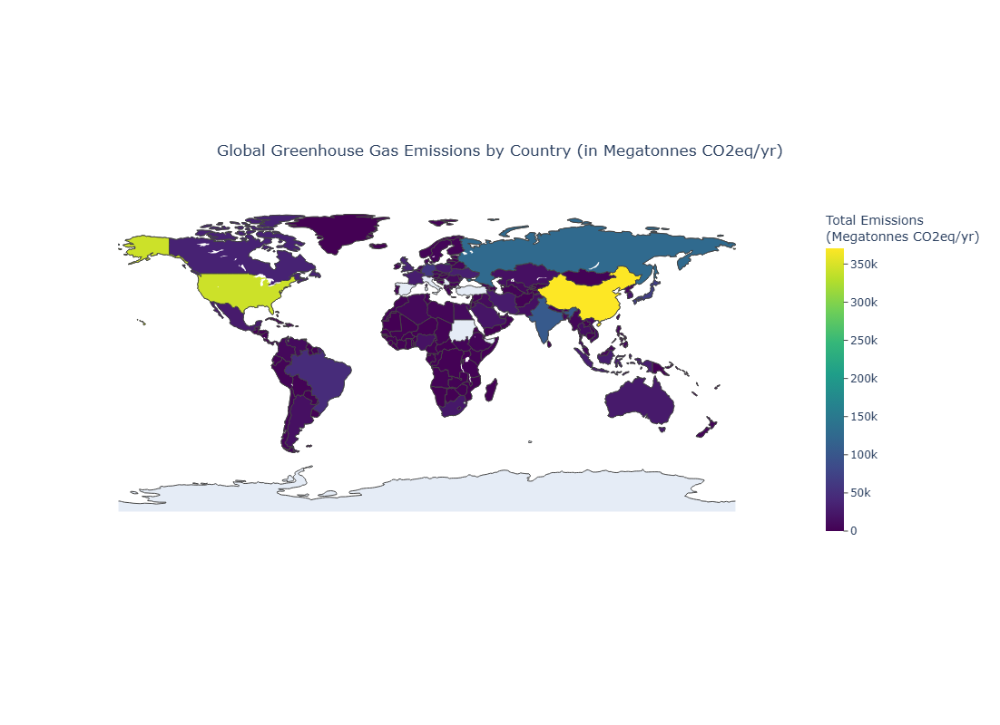

In [21]:
# Create a choropleth map to visualize greenhouse gas emissions by country
fig = px.choropleth(
    df_cleaned,
    locations="Country",          # Column containing country names
    locationmode="country names", # Match country names to the corresponding map regions
    color="Total_Emissions",      # Data used for color coding based on total emissions
    hover_data={                  # Data to display on hover
        "Country": True,          # Show country name on hover
        "Total_Emissions": True,  # Show total emissions on hover
        "Average Percentage (%)": True  # Show average percentage on hover
    },
    color_continuous_scale="Viridis",  # Color scale for emissions visualization
    title="Global Greenhouse Gas Emissions by Country",
)

# Update layout for improved visualization and adjust map size
fig.update_layout(
    geo=dict(
        showframe=False,         # Hide the frame around the map
        showcoastlines=True,     # Show coastlines for better geographic context
        projection_type="equirectangular",  # Use equirectangular projection
    ),
    title={
        'text': "Global Greenhouse Gas Emissions by Country (in Megatonnes CO2eq/yr)",
        'y': 0.80,              # Set vertical position of the title
        'x': 0.5,               # Center the title horizontally
        'xanchor': 'center',    # Anchor the title to the center
        'yanchor': 'top'        # Anchor the title to the top
    },
    width=1100,                  # Set the width of the map
    height=800,                  # Set the height of the map
    coloraxis_colorbar=dict(
        title="Total Emissions<br>(Megatonnes CO2eq/yr)",  # Add units to the color bar title
        ticks="outside",                                  # Place ticks outside the color bar
        len=0.6,                                          # Adjust the length of the color bar
        thickness=20,                                     # Adjust the thickness of the color bar
        x=1.05,                                           # Position the color bar outside the map
        xanchor="left",                                   # Anchor the color bar position to the left
    ),
)

# Display the map
fig.show()

In [24]:
import plotly.offline as pyo

# Generate the HTML code for the map visualization
html_div = pyo.plot(fig, include_plotlyjs=False, output_type='div')

# Print the HTML code
print(html_div)

# (Optional) Save the HTML code to a file
with open('map_visualization.html', 'w') as f:
    f.write(html_div)

<div>                            <div id="08d92a73-ca11-47f5-94da-65e0ccf615be" class="plotly-graph-div" style="height:800px; width:1100px;"></div>            <script type="text/javascript">                                    window.PLOTLYENV=window.PLOTLYENV || {};                                    if (document.getElementById("08d92a73-ca11-47f5-94da-65e0ccf615be")) {                    Plotly.newPlot(                        "08d92a73-ca11-47f5-94da-65e0ccf615be",                        [{"coloraxis":"coloraxis","customdata":[["Aruba",16.288465028727106,0.001],["Afghanistan",976.9360965808278,0.05],["Angola",2644.3116901441426,0.135],["Anguilla",0.8244895417845178,0.0],["Albania",491.9613851240671,0.025],["Cura\u00e7ao",342.37635319091225,0.018],["United Arab Emirates",7130.644081146919,0.365],["Argentina",15767.20229016861,0.807],["Armenia",675.4793780400234,0.035],["Antigua and Barbuda",14.302969682986001,0.001],["Australia",26530.005953970816,1.358],["Austria",4445.519100103965,0.

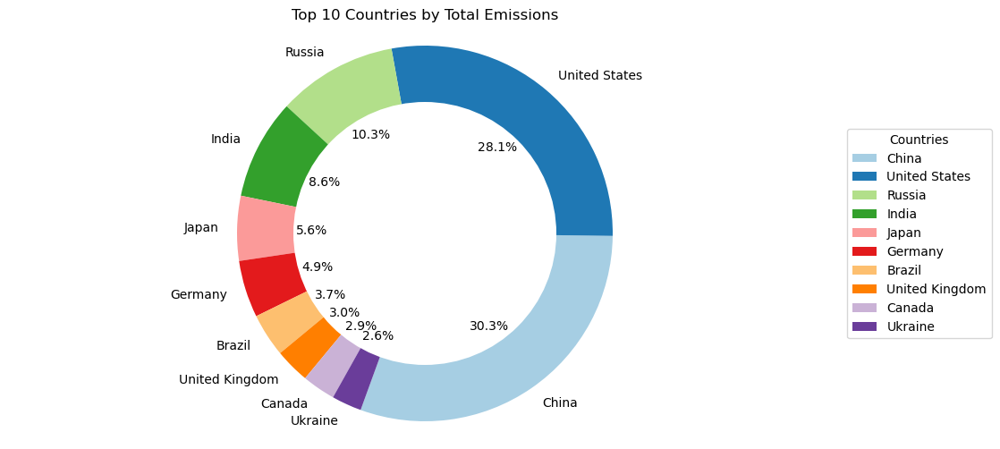

In [282]:
# Data for the donut chart
labels = top_10_emissions['Country']              # Labels for each slice of the donut chart
sizes = top_10_emissions['Total_Emissions']       # Sizes corresponding to total emissions for each country
colors = plt.cm.Paired(range(len(labels)))        # Generate a color map for the slices

# Create the donut chart
plt.figure(figsize=(12, 6))                       # Set the figure size
# Create a pie chart to represent emissions data
wedges, texts, autotexts = plt.pie(
    sizes, 
    labels=labels, 
    autopct='%1.1f%%',               # Display percentage on each slice
    startangle=250,                  # Start the pie chart at a specific angle
    colors=colors                     # Apply the color map
)

# Draw a circle at the center of the pie chart to create a donut effect
centre_circle = plt.Circle((0, 0), 0.70, fc='white')  # Circle with white fill
fig = plt.gcf()                                   # Get the current figure
fig.gca().add_artist(centre_circle)               # Add the circle to the figure

# Add the legend to describe each country
plt.legend(wedges, labels, title="Countries", loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))

# Equal aspect ratio ensures that the donut is drawn as a circle
plt.axis('equal')  
plt.title('Top 10 Countries by Total Emissions')  # Set the title of the chart
plt.show()                                         # Display the donut chart

In [21]:
# Calculate total emissions per year by summing emissions across all countries
total_emissions_per_year = df_cleaned.iloc[:, 3:57].sum(axis=0)  # Sums emissions for each year across selected columns

# Create a new DataFrame for improved visualization of total emissions
total_emissions_df = pd.DataFrame(total_emissions_per_year, columns=['Total Emissions']).reset_index()
total_emissions_df.columns = ['Year', 'Total Emissions']  # Rename columns for clarity

# Display the total emissions per year
print(total_emissions_df)  # Output the DataFrame showing total emissions by year
print("\nMt CO2eq/yr: Megatonnes of Carbon Dioxide Equivalent per Year")  # Provide units for emissions

    Year  Total Emissions
0   1970     23454.404432
1   1971     23500.073481
2   1972     24395.009208
3   1973     25578.286906
4   1974     25608.930750
5   1975     25653.712396
6   1976     26770.557270
7   1977     27421.291830
8   1978     28116.734491
9   1979     28788.023144
10  1980     28507.909972
11  1981     28008.662149
12  1982     27824.356981
13  1983     28069.314012
14  1984     28847.436486
15  1985     29117.849075
16  1986     29552.866200
17  1987     30277.966843
18  1988     31195.054499
19  1989     31746.746561
20  1990     32066.636155
21  1991     32110.869917
22  1992     31984.597694
23  1993     32055.637816
24  1994     32379.605440
25  1995     33177.620430
26  1996     33794.110700
27  1997     34176.326827
28  1998     34236.910647
29  1999     34419.569951
30  2000     35279.882831
31  2001     35597.667640
32  2002     35997.798667
33  2003     37500.510765
34  2004     38987.211347
35  2005     40253.410445
36  2006     41374.007541
37  2007    

In [13]:
# Given values for greenhouse gas emissions in 1970 and 2023
emissions_1970 = 23454.404432  # Mt CO2eq/yr
emissions_2023 = 51717.779062  # Mt CO2eq/yr

# Calculate the percentage rise
percentage_rise = ((emissions_2023 - emissions_1970) / emissions_1970) * 100
print("Percentage rise of greenhouse gas emissions from 1970 to 2023:", percentage_rise, "%")

Percentage rise of greenhouse gas emissions from 1970 to 2023: 120.50348458833125 %


Top 5 emitting countries:
China
United States
Russia
India
Japan


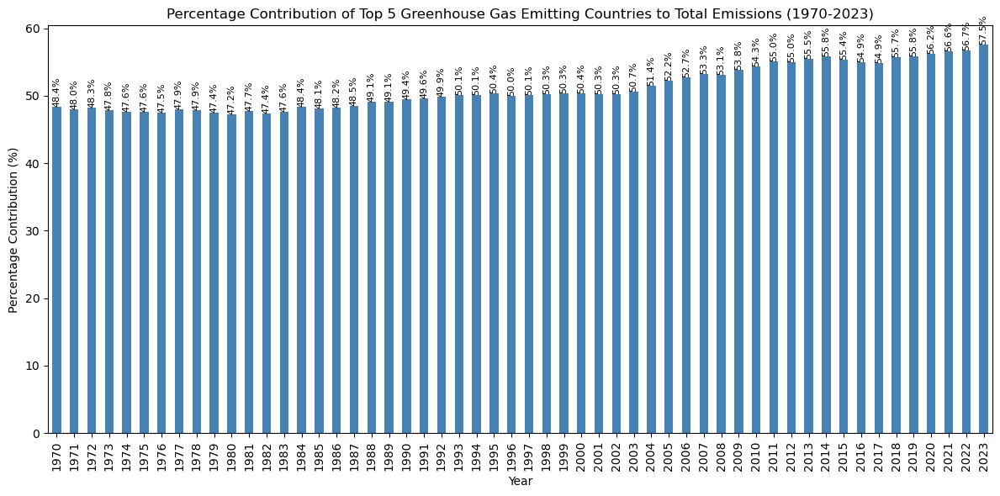

In [284]:
# Calculate total emissions for each country over the years by summing emissions across all selected columns
country_emissions = df_cleaned.set_index('Country').iloc[:, 2:56].sum(axis=1)

# Identify the top 5 emitting countries based on total emissions
top_5_countries = country_emissions.nlargest(5).index

# Print the names of the top 5 emitting countries
print("Top 5 emitting countries:")
for country in top_5_countries:
    print(country)

# Create a new DataFrame containing emissions data for the top emitting countries
top_country_emissions = df[df['Country'].isin(top_5_countries)]

# Calculate the total emissions per year for the top countries
top_country_emissions_per_year = top_country_emissions.set_index('Country').iloc[:, 2:56].sum()

# Calculate the percentage contribution of the top countries to total emissions
percentage_contribution = (top_country_emissions_per_year / total_emissions_per_year) * 100

# Create a bar plot to visualize the percentage contributions
plt.figure(figsize=(12, 6))
bars = percentage_contribution.plot(kind='bar', color='steelblue')

# Adding title and axis labels for clarity
plt.title('Percentage Contribution of Top 5 Greenhouse Gas Emitting Countries to Total Emissions (1970-2023)')
plt.xlabel('Year')
plt.ylabel('Percentage Contribution (%)')

# Annotate each bar with its percentage value
for bar in bars.patches:
    # Get the height of the bar
    height = bar.get_height()
    # Add a text label on top of the bar, aligned at the center
    plt.text(bar.get_x() + bar.get_width() / 2, height, f'{height:.1f}%', 
             ha='center', va='bottom', fontsize=8, rotation=90)

# Show the plot with tight layout
plt.tight_layout()
plt.show()

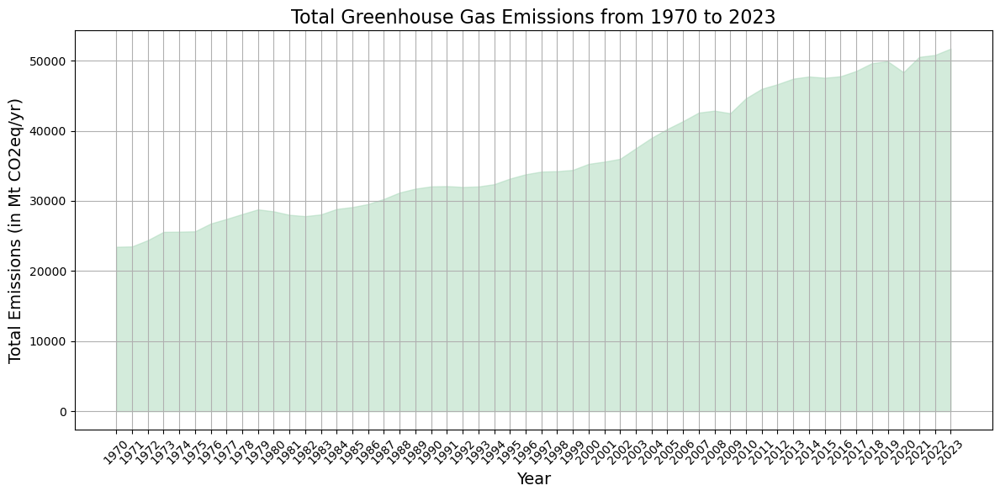

In [23]:
# Create a figure with specified size
plt.figure(figsize=(12, 6))

# Fill the area under the total emissions curve with a light green color
plt.fill_between(total_emissions_df['Year'], total_emissions_df['Total Emissions'], color='#A8D8B9', alpha=0.5)

# Set the title and labels for the plot with appropriate font sizes
plt.title('Total Greenhouse Gas Emissions from 1970 to 2023', fontsize=16)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Total Emissions (in Mt CO2eq/yr)', fontsize=14)

# Rotate x-ticks for better readability
plt.xticks(total_emissions_df['Year'], rotation=45)

# Adjust layout to prevent clipping of labels
plt.tight_layout()
plt.grid()

# Display the plot
plt.show()

In [288]:
# Group by 'Continent' and sum the 'Total Emissions'
total_emissions_per_continent = (
    df_cleaned
    .groupby('Continent')['Total_Emissions']
    .sum()
    .reset_index()
)

# Rename the columns for better readability
total_emissions_per_continent.columns = ['Continent', 'Total Emissions']

# Calculate the total emissions for percentage calculation
total_emissions = total_emissions_per_continent['Total Emissions'].sum()

# Create a new column for the average percentage and round to 3 decimal places
total_emissions_per_continent['Average Percentage (%)'] = ((total_emissions_per_continent['Total Emissions'] / total_emissions) * 100).round(3)

# Sort the results from highest to lowest
total_emissions_per_continent.sort_values(by='Total Emissions', ascending=False, inplace=True)

# Display the results with a clear message
print(total_emissions_per_continent)
print("\nMt CO2eq/yr: Megatonnes of Carbon Dioxide Equivalent per Year")

       Continent  Total Emissions  Average Percentage (%)
1           Asia    960024.718170                  49.154
3  North America    417461.598103                  21.374
2         Europe    336643.627534                  17.236
0         Africa    112582.204785                   5.764
5  South America     94915.331526                   4.860
4        Oceania     31466.738254                   1.611

Mt CO2eq/yr: Megatonnes of Carbon Dioxide Equivalent per Year


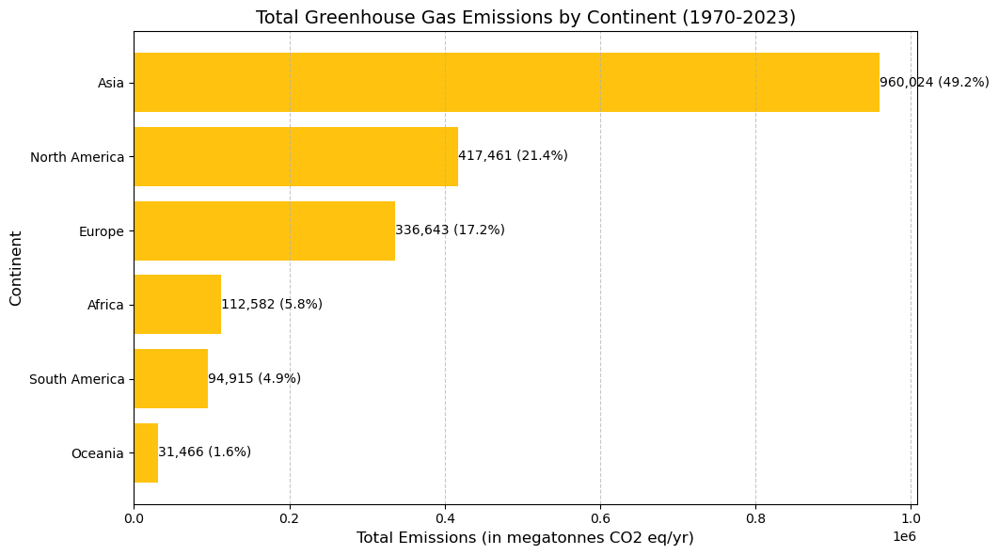

In [289]:
# Assuming total_emissions_per_continent DataFrame has columns 'Continent', 'Total Emissions', and 'Average Percentage (%)'
plt.figure(figsize=(10, 6))
bars = plt.barh(total_emissions_per_continent['Continent'], total_emissions_per_continent['Total Emissions'], color='#FFC30F')

# Invert the y-axis to have the longest bar at the top
plt.gca().invert_yaxis()

# Add labels and title
plt.xlabel('Total Emissions (in megatonnes CO2 eq/yr)', fontsize=12)
plt.ylabel('Continent', fontsize=12)
plt.title('Total Greenhouse Gas Emissions by Continent (1970-2023)', fontsize=14)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.grid(axis='x', linestyle='--', alpha=0.7)  # Add grid lines for better readability
plt.tight_layout()

# Annotate each bar with the total emissions value and average percentage
for bar, avg_percent in zip(bars, total_emissions_per_continent['Average Percentage (%)']):
    total_emission = int(bar.get_width())
    plt.text(bar.get_width(), bar.get_y() + bar.get_height() / 2, 
             f'{total_emission:,} ({avg_percent:.1f}%)', 
             va='center', ha='left', fontsize=10, color='black')

# Show the plot
plt.show()

In [290]:
df_cleaned

,EDGAR Country Code,Country,Continent,1970,1971,1972,1973,1974,1975,1976,...,2016,2017,2018,2019,2020,2021,2022,2023,Total_Emissions,Average Percentage (%)
0,ABW,Aruba,North America,0.036713,0.041538,0.052391,0.057360,0.056630,0.070743,0.069793,...,0.514539,0.496141,0.495532,0.588998,0.482160,0.531202,0.533603,0.561498,16.288465,0.001
1,AFG,Afghanistan,Asia,15.437430,15.364077,13.316628,13.934875,15.177862,15.843058,15.943325,...,26.633999,27.691927,27.553282,26.982777,26.646320,27.643074,28.614071,29.460052,976.936097,0.050
2,AGO,Angola,Africa,18.998763,18.866057,21.459002,23.018941,23.685423,22.519608,18.586243,...,78.875889,73.424409,69.504638,69.910832,61.680081,64.408994,67.210842,67.700756,2644.311690,0.135
3,AIA,Anguilla,North America,0.003355,0.003396,0.003534,0.003411,0.003694,0.003968,0.003833,...,0.031728,0.032476,0.031594,0.030948,0.026037,0.025224,0.025068,0.026211,0.824490,0.000
4,ALB,Albania,Europe,8.224850,8.170885,9.104799,8.585434,8.854280,9.033384,9.644184,...,8.356522,9.164059,9.152843,8.618593,7.967356,8.395251,7.812022,7.673672,491.961385,0.025
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
203,WSM,Samoa,Oceania,0.157804,0.158061,0.162919,0.178156,0.201811,0.189211,0.190172,...,0.572071,0.568273,0.548016,0.570495,0.565562,0.617131,0.635670,0.646144,19.229214,0.001
204,YEM,Yemen,Asia,5.397884,5.694599,5.955398,6.260079,6.483728,6.502045,6.816709,...,27.158584,28.836472,31.936295,33.620228,32.878086,33.430707,33.175042,32.242872,1365.565354,0.070
205,ZAF,South Africa,Africa,241.122287,240.628058,247.926802,267.008805,276.088222,294.291848,310.314306,...,583.291494,595.317587,598.069377,602.850939,541.709644,550.984438,533.026896,522.115491,23977.339127,1.228
206,ZMB,Zambia,Africa,12.463517,12.718537,13.299005,13.759407,13.976796,14.269532,14.699720,...,24.219765,25.930251,27.255061,26.824978,27.344120,28.249100,29.845830,30.484449,943.164536,0.048


In [291]:
# Get the list of countries
countries = df_cleaned['Country'].unique()

# Number of graphs per row
graphs_per_row = 3
total_countries = len(countries)

# Create subplots
fig, axes = plt.subplots(
    nrows=(total_countries // graphs_per_row + (total_countries % graphs_per_row > 0)),
    ncols=graphs_per_row,
    figsize=(18, 6 * (total_countries // graphs_per_row + 1))
)

# Flatten axes array for easier iteration
axes = axes.flatten()

# Iterate through each country and create line graphs
for idx, country in enumerate(countries):
    # Filter data for the current country
    country_data = df_cleaned[df_cleaned['Country'] == country]
    
    # Get year-wise emissions for the country
    years = df_cleaned.columns[4:-2]  # Assuming year columns start from index 4
    emissions = country_data.iloc[0, 4:-2]  # Get the emission values for the current country

    # Convert years to integers for plotting
    years = years.astype(int)

    # Plot the line graph on the respective subplot
    ax = axes[idx]
    ax.plot(years, emissions, color='green', marker='o', linestyle='-', linewidth=1, markersize=2)
    ax.set_title(f'{country}', fontsize=12)
    ax.set_xlabel('Year', fontsize=10)
    ax.set_ylabel('Greenhouse Gas Emissions (in Mt CO2 eq/yr)', fontsize=10)
    ax.grid(alpha=0.3)

# Turn off unused subplots
for j in range(len(countries), len(axes)):
    fig.delaxes(axes[j])

# Adjust layout
plt.tight_layout()
plt.show()

In [ ]:
# Load the specific sheet from the Excel file
# Replace 'Shipping_and_aviation' with the actual name of the sheet you want to use
# For instance, if you want to analyze data related to carbon emissions from shipping and aviation,
# ensure that the sheet name matches exactly with the one in the Excel file.
sheet_name_2 = 'Shipping_and_aviation'  # The sheet name to be loaded
df_1 = pd.read_excel(excel_file, sheet_name=sheet_name_2)  # Load the data into a DataFrame

In [167]:
print(df_1.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2 entries, 0 to 1
Data columns (total 57 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   EDGAR Country Code  2 non-null      object 
 1   Country             2 non-null      object 
 2   Continent           0 non-null      float64
 3   1970                2 non-null      float64
 4   1971                2 non-null      float64
 5   1972                2 non-null      float64
 6   1973                2 non-null      float64
 7   1974                2 non-null      float64
 8   1975                2 non-null      float64
 9   1976                2 non-null      float64
 10  1977                2 non-null      float64
 11  1978                2 non-null      float64
 12  1979                2 non-null      float64
 13  1980                2 non-null      float64
 14  1981                2 non-null      float64
 15  1982                2 non-null      float64
 16  1983        

In [168]:
df_1.drop(columns='Continent', inplace=True)

In [169]:
print(df_1.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2 entries, 0 to 1
Data columns (total 56 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   EDGAR Country Code  2 non-null      object 
 1   Country             2 non-null      object 
 2   1970                2 non-null      float64
 3   1971                2 non-null      float64
 4   1972                2 non-null      float64
 5   1973                2 non-null      float64
 6   1974                2 non-null      float64
 7   1975                2 non-null      float64
 8   1976                2 non-null      float64
 9   1977                2 non-null      float64
 10  1978                2 non-null      float64
 11  1979                2 non-null      float64
 12  1980                2 non-null      float64
 13  1981                2 non-null      float64
 14  1982                2 non-null      float64
 15  1983                2 non-null      float64
 16  1984        

In [170]:
# Rename the column 'Country' to 'International_Transport'
df_1.rename(columns={'Country': 'International_Transport'}, inplace=True)

In [171]:
print(df_1.columns)

Index([     'EDGAR Country Code', 'International_Transport',
                            1970,                      1971,
                            1972,                      1973,
                            1974,                      1975,
                            1976,                      1977,
                            1978,                      1979,
                            1980,                      1981,
                            1982,                      1983,
                            1984,                      1985,
                            1986,                      1987,
                            1988,                      1989,
                            1990,                      1991,
                            1992,                      1993,
                            1994,                      1995,
                            1996,                      1997,
                            1998,                      1999,
                        

In [172]:
# Specify the year columns for summation (1970 to 2023)
# Convert integers to strings for consistency in naming
year_columns = [year for year in range(1970, 2024)]  # List of year columns as integers

# Calculate total emissions from shipping and aviation
total_emissions_shipping_aviation = df_1[year_columns].sum(axis=1)

# Add the Total_Emissions column to df_1
df_1['Total_Emissions'] = total_emissions_shipping_aviation

# Create the new dataframe with the relevant columns
df_totalEmissions_shippingAndAviation = df_1[['International_Transport', 'Total_Emissions']]

# Display the new dataframe
print(df_totalEmissions_shippingAndAviation.to_string(index = False))
print("\n Mt CO2eq/yr : Megatonnes of Carbon Dioxide Equivalent per Year")

International_Transport  Total_Emissions
 International Aviation     18317.017355
 International Shipping     27625.025243

 Mt CO2eq/yr : Megatonnes of Carbon Dioxide Equivalent per Year


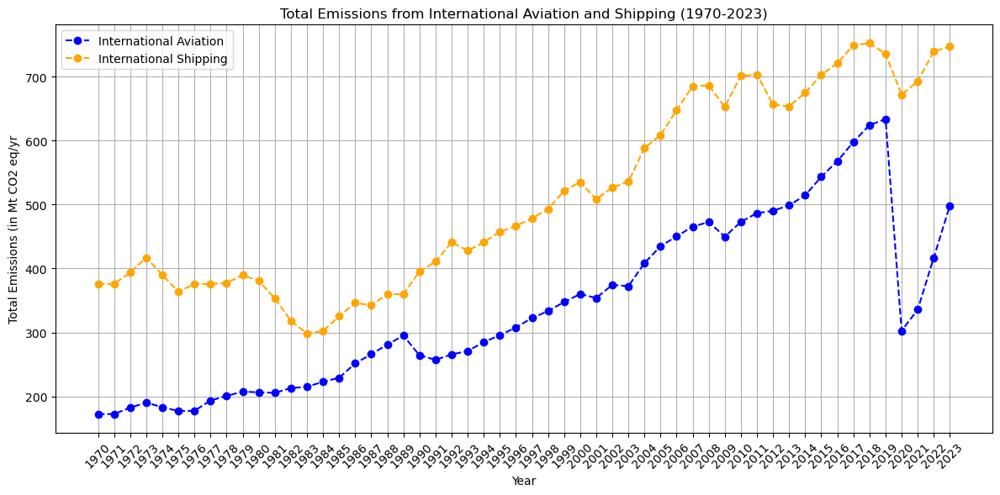

In [173]:
# Specify the year columns for summation (1970 to 2023)
year_columns = [year for year in range(1970, 2024)]  # List of year columns as integers

# Extract the emissions data for Aviation and Shipping
aviation_data = df_1[df_1['International_Transport'] == 'International Aviation'][year_columns].values.flatten()
shipping_data = df_1[df_1['International_Transport'] == 'International Shipping'][year_columns].values.flatten()

# Create a dual line graph
plt.figure(figsize=(12, 6))

# Plot both International Aviation and International Shipping
plt.plot(year_columns, aviation_data, marker='o', color='blue', linestyle='--', label='International Aviation')
plt.plot(year_columns, shipping_data, marker='o', color='orange', linestyle='--', label='International Shipping')

# Adding titles and labels
plt.title('Total Emissions from International Aviation and Shipping (1970-2023)')
plt.xlabel('Year')
plt.ylabel('Total Emissions (in Mt CO2 eq/yr')
plt.xticks(year_columns, rotation=45)

# Add legend
plt.legend()

# Show grid
plt.grid()

# Display the plot
plt.tight_layout()  # Adjust layout to make room for labels
plt.show()

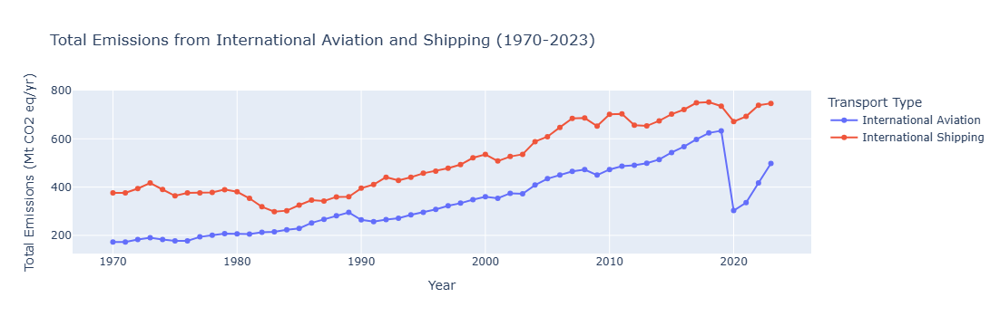

In [174]:
import plotly.graph_objects as go

fig = go.Figure()
fig.add_trace(go.Scatter(x=year_columns, y=aviation_data, mode='lines+markers', name='International Aviation'))
fig.add_trace(go.Scatter(x=year_columns, y=shipping_data, mode='lines+markers', name='International Shipping'))
fig.update_layout(title='Total Emissions from International Aviation and Shipping (1970-2023)',
                  xaxis_title='Year',
                  yaxis_title='Total Emissions (Mt CO2 eq/yr)',
                  legend_title='Transport Type')
fig.show()

In [175]:
# Load the specific sheet (replace 'YourSheetName' with the actual name of the sheet you want to use)
# For example, if the sheet name is 'Carbon Emissions', use that name
sheet_name_3 = 'GHG_by_sector_and_country'  # Replace with the actual sheet name
df_2 = pd.read_excel(excel_file, sheet_name=sheet_name_3)
print(df_2)

            Substance                 Sector EDGAR Country Code       Country  \
0                 CO2            Agriculture                AFG   Afghanistan   
1                 CO2            Agriculture                ALB       Albania   
2                 CO2            Agriculture                ARG     Argentina   
3                 CO2            Agriculture                ARM       Armenia   
4                 CO2            Agriculture                AUS     Australia   
...               ...                    ...                ...           ...   
4848  GWP_100_AR5_N2O  Industrial Combustion       GLOBAL TOTAL  GLOBAL TOTAL   
4849  GWP_100_AR5_N2O         Power Industry       GLOBAL TOTAL  GLOBAL TOTAL   
4850  GWP_100_AR5_N2O              Processes       GLOBAL TOTAL  GLOBAL TOTAL   
4851  GWP_100_AR5_N2O              Transport       GLOBAL TOTAL  GLOBAL TOTAL   
4852  GWP_100_AR5_N2O                  Waste       GLOBAL TOTAL  GLOBAL TOTAL   

            1970        197

In [176]:
global_total_emissions = df_2.tail(25)
print(global_total_emissions)

                Substance                 Sector EDGAR Country Code  \
4828                  CO2            Agriculture       GLOBAL TOTAL   
4829                  CO2              Buildings       GLOBAL TOTAL   
4830                  CO2      Fuel Exploitation       GLOBAL TOTAL   
4831                  CO2  Industrial Combustion       GLOBAL TOTAL   
4832                  CO2         Power Industry       GLOBAL TOTAL   
4833                  CO2              Processes       GLOBAL TOTAL   
4834                  CO2              Transport       GLOBAL TOTAL   
4835                  CO2                  Waste       GLOBAL TOTAL   
4836      GWP_100_AR5_CH4            Agriculture       GLOBAL TOTAL   
4837      GWP_100_AR5_CH4              Buildings       GLOBAL TOTAL   
4838      GWP_100_AR5_CH4      Fuel Exploitation       GLOBAL TOTAL   
4839      GWP_100_AR5_CH4  Industrial Combustion       GLOBAL TOTAL   
4840      GWP_100_AR5_CH4         Power Industry       GLOBAL TOTAL   
4841  

In [177]:
global_total_emissions = global_total_emissions.drop(columns=['EDGAR Country Code', 'Country'])

In [178]:
print(global_total_emissions)

                Substance                 Sector         1970         1971  \
4828                  CO2            Agriculture    50.083941    50.083941   
4829                  CO2              Buildings  2932.189907  2945.300450   
4830                  CO2      Fuel Exploitation  1355.176495  1369.087483   
4831                  CO2  Industrial Combustion  3847.727102  3578.115940   
4832                  CO2         Power Industry  3822.142420  3909.623805   
4833                  CO2              Processes   915.906389   922.117394   
4834                  CO2              Transport  2821.213576  2901.446723   
4835                  CO2                  Waste     7.418215     7.614081   
4836      GWP_100_AR5_CH4            Agriculture  3586.328264  3648.058120   
4837      GWP_100_AR5_CH4              Buildings   245.217332   241.288115   
4838      GWP_100_AR5_CH4      Fuel Exploitation  1919.991631  1896.829990   
4839      GWP_100_AR5_CH4  Industrial Combustion     8.790745   

In [179]:
# Filter the DataFrame for 'CO2' in the 'Substance' column
global_total_emissions_CO2 = global_total_emissions[global_total_emissions['Substance'] == 'CO2']

In [180]:
print(global_total_emissions_CO2)

     Substance                 Sector         1970         1971         1972  \
4828       CO2            Agriculture    50.083941    50.083941    50.083941   
4829       CO2              Buildings  2932.189907  2945.300450  3062.611174   
4830       CO2      Fuel Exploitation  1355.176495  1369.087483  1452.567265   
4831       CO2  Industrial Combustion  3847.727102  3578.115940  3658.621198   
4832       CO2         Power Industry  3822.142420  3909.623805  4188.505782   
4833       CO2              Processes   915.906389   922.117394   990.445441   
4834       CO2              Transport  2821.213576  2901.446723  3070.785116   
4835       CO2                  Waste     7.418215     7.614081     7.816160   

             1973         1974         1975         1976         1977  ...  \
4828    50.083941    50.684489    55.325283    58.498207    62.953207  ...   
4829  3126.137247  3046.229326  3121.851242  3248.588200  3267.114380  ...   
4830  1627.795725  1621.327148  1475.599871  

In [181]:
# Add the values in the year columns row-wise
# Assuming the years are from 1970 to 2023
year_columns = global_total_emissions_CO2.columns[2:]  # Select year columns (from the third column onward)
global_total_emissions_CO2.loc[:, 'Total_Emissions'] = global_total_emissions_CO2[year_columns].sum(axis=1)

     Substance                 Sector         1970         1971         1972  \
4828       CO2            Agriculture    50.083941    50.083941    50.083941   
4829       CO2              Buildings  2932.189907  2945.300450  3062.611174   
4830       CO2      Fuel Exploitation  1355.176495  1369.087483  1452.567265   
4831       CO2  Industrial Combustion  3847.727102  3578.115940  3658.621198   
4832       CO2         Power Industry  3822.142420  3909.623805  4188.505782   
4833       CO2              Processes   915.906389   922.117394   990.445441   
4834       CO2              Transport  2821.213576  2901.446723  3070.785116   
4835       CO2                  Waste     7.418215     7.614081     7.816160   

             1973         1974         1975         1976         1977  ...  \
4828    50.083941    50.684489    55.325283    58.498207    62.953207  ...   
4829  3126.137247  3046.229326  3121.851242  3248.588200  3267.114380  ...   
4830  1627.795725  1621.327148  1475.599871  

C:\Users\Anwesh\AppData\Local\Temp\ipykernel_11540\1042091041.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [182]:
print(global_total_emissions_CO2)

     Substance                 Sector         1970         1971         1972  \
4828       CO2            Agriculture    50.083941    50.083941    50.083941   
4829       CO2              Buildings  2932.189907  2945.300450  3062.611174   
4830       CO2      Fuel Exploitation  1355.176495  1369.087483  1452.567265   
4831       CO2  Industrial Combustion  3847.727102  3578.115940  3658.621198   
4832       CO2         Power Industry  3822.142420  3909.623805  4188.505782   
4833       CO2              Processes   915.906389   922.117394   990.445441   
4834       CO2              Transport  2821.213576  2901.446723  3070.785116   
4835       CO2                  Waste     7.418215     7.614081     7.816160   

             1973         1974         1975         1976         1977  ...  \
4828    50.083941    50.684489    55.325283    58.498207    62.953207  ...   
4829  3126.137247  3046.229326  3121.851242  3248.588200  3267.114380  ...   
4830  1627.795725  1621.327148  1475.599871  

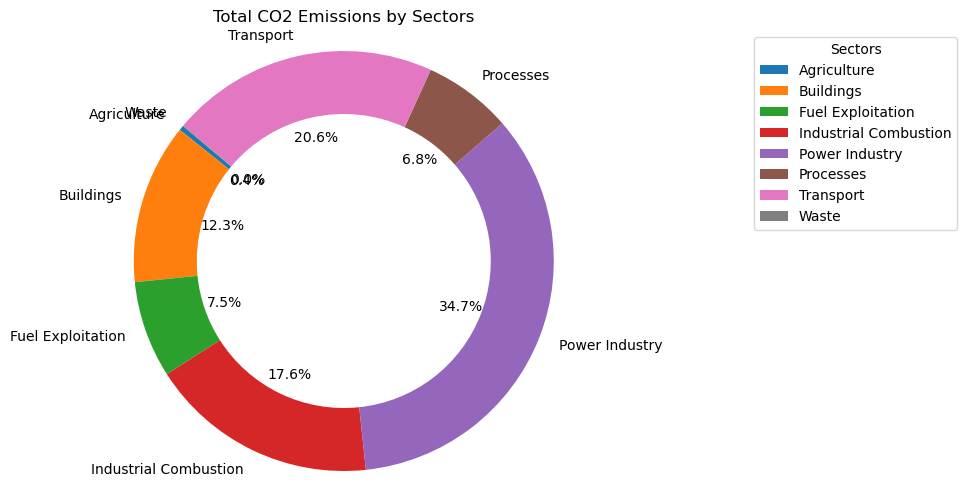

In [183]:
# Create a pie chart
plt.figure(figsize=(8, 6))
# Create the pie chart with a hole for donut chart
wedges, texts, autotexts = plt.pie(
    global_total_emissions_CO2['Total_Emissions'],
    labels= global_total_emissions_CO2['Sector'],
    autopct='%1.1f%%',
    startangle=140,
    radius=1.0,  # Adjust this value to change the size of the donut hole
    wedgeprops=dict(width=0.3)  # This makes the donut shape
)

# Set the title
plt.title('Total CO2 Emissions by Sectors')
plt.axis('equal')  # Equal aspect ratio ensures that pie chart is circular.

# Create legend
plt.legend(wedges, global_total_emissions_CO2['Sector'], title="Sectors", loc="best", bbox_to_anchor=(1, 0, 0.5, 1))

# Show the chart
plt.show()

In [184]:
# Filter the DataFrame for 'CH4' in the 'Substance' column
global_total_emissions_CH4 = global_total_emissions[global_total_emissions['Substance'] == 'GWP_100_AR5_CH4']

# Filter the DataFrame for 'N2O' in the 'Substance' column
global_total_emissions_N2O = global_total_emissions[global_total_emissions['Substance'] == 'GWP_100_AR5_N2O']

In [185]:
print(global_total_emissions_CH4)

            Substance                 Sector         1970         1971  \
4836  GWP_100_AR5_CH4            Agriculture  3586.328264  3648.058120   
4837  GWP_100_AR5_CH4              Buildings   245.217332   241.288115   
4838  GWP_100_AR5_CH4      Fuel Exploitation  1919.991631  1896.829990   
4839  GWP_100_AR5_CH4  Industrial Combustion     8.790745     8.133762   
4840  GWP_100_AR5_CH4         Power Industry     1.436221     1.480907   
4841  GWP_100_AR5_CH4              Processes     5.234142     4.867556   
4842  GWP_100_AR5_CH4              Transport    20.198684    21.052211   
4843  GWP_100_AR5_CH4                  Waste   866.853343   916.782757   

             1972         1973         1974         1975         1976  \
4836  3662.140000  3710.468391  3763.272563  3814.828631  3828.638271   
4837   243.212414   245.696202   249.399281   255.650611   259.625817   
4838  1952.474090  2056.066154  2013.705712  2004.813533  2046.308656   
4839     8.356757     8.637342     8.7777

In [186]:
print(global_total_emissions_N2O)

            Substance                 Sector        1970        1971  \
4845  GWP_100_AR5_N2O            Agriculture  893.532938  908.600556   
4846  GWP_100_AR5_N2O              Buildings   46.486553   46.493771   
4847  GWP_100_AR5_N2O      Fuel Exploitation    2.865831    3.010711   
4848  GWP_100_AR5_N2O  Industrial Combustion   13.136135   12.166075   
4849  GWP_100_AR5_N2O         Power Industry   14.479735   14.585932   
4850  GWP_100_AR5_N2O              Processes  395.228152  400.228385   
4851  GWP_100_AR5_N2O              Transport   34.074976   34.673528   
4852  GWP_100_AR5_N2O                  Waste   43.703561   44.399613   

            1972        1973        1974        1975         1976  \
4845  918.362063  930.117284  938.179501  972.457309  1000.180441   
4846   48.022038   50.057999   50.579184   52.338108    53.839057   
4847    3.201675    3.612522    3.661887    3.476810     3.737748   
4848   12.387045   12.767578   12.797153   12.714596    13.162267   
4849  

In [187]:
print(global_total_emissions.head(5))

     Substance                 Sector         1970         1971         1972  \
4828       CO2            Agriculture    50.083941    50.083941    50.083941   
4829       CO2              Buildings  2932.189907  2945.300450  3062.611174   
4830       CO2      Fuel Exploitation  1355.176495  1369.087483  1452.567265   
4831       CO2  Industrial Combustion  3847.727102  3578.115940  3658.621198   
4832       CO2         Power Industry  3822.142420  3909.623805  4188.505782   

             1973         1974         1975         1976         1977  ...  \
4828    50.083941    50.684489    55.325283    58.498207    62.953207  ...   
4829  3126.137247  3046.229326  3121.851242  3248.588200  3267.114380  ...   
4830  1627.795725  1621.327148  1475.599871  1591.586115  1589.657653  ...   
4831  3848.385806  3838.422487  3715.200689  3883.827959  4053.241249  ...   
4832  4525.957113  4608.946375  4697.901824  5060.610091  5280.818863  ...   

              2014          2015          2016    

In [188]:
# Add the values in the year columns row-wise
# Assuming the years are from 1970 to 2023
year_columns_1 = global_total_emissions_CH4.columns[2:]  # Select year columns (from the third column onward)
year_columns_2 = global_total_emissions_N2O.columns[2:]  # Select year columns (from the third column onward)
global_total_emissions_CH4.loc[:, 'Total_Emissions'] = global_total_emissions_CH4[year_columns_1].sum(axis=1)
global_total_emissions_N2O.loc[:, 'Total_Emissions'] = global_total_emissions_N2O[year_columns_2].sum(axis=1)

C:\Users\Anwesh\AppData\Local\Temp\ipykernel_11540\2956115610.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Anwesh\AppData\Local\Temp\ipykernel_11540\2956115610.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [189]:
print(global_total_emissions_CH4)

            Substance                 Sector         1970         1971  \
4836  GWP_100_AR5_CH4            Agriculture  3586.328264  3648.058120   
4837  GWP_100_AR5_CH4              Buildings   245.217332   241.288115   
4838  GWP_100_AR5_CH4      Fuel Exploitation  1919.991631  1896.829990   
4839  GWP_100_AR5_CH4  Industrial Combustion     8.790745     8.133762   
4840  GWP_100_AR5_CH4         Power Industry     1.436221     1.480907   
4841  GWP_100_AR5_CH4              Processes     5.234142     4.867556   
4842  GWP_100_AR5_CH4              Transport    20.198684    21.052211   
4843  GWP_100_AR5_CH4                  Waste   866.853343   916.782757   

             1972         1973         1974         1975         1976  \
4836  3662.140000  3710.468391  3763.272563  3814.828631  3828.638271   
4837   243.212414   245.696202   249.399281   255.650611   259.625817   
4838  1952.474090  2056.066154  2013.705712  2004.813533  2046.308656   
4839     8.356757     8.637342     8.7777

In [190]:
print(global_total_emissions_N2O)

            Substance                 Sector        1970        1971  \
4845  GWP_100_AR5_N2O            Agriculture  893.532938  908.600556   
4846  GWP_100_AR5_N2O              Buildings   46.486553   46.493771   
4847  GWP_100_AR5_N2O      Fuel Exploitation    2.865831    3.010711   
4848  GWP_100_AR5_N2O  Industrial Combustion   13.136135   12.166075   
4849  GWP_100_AR5_N2O         Power Industry   14.479735   14.585932   
4850  GWP_100_AR5_N2O              Processes  395.228152  400.228385   
4851  GWP_100_AR5_N2O              Transport   34.074976   34.673528   
4852  GWP_100_AR5_N2O                  Waste   43.703561   44.399613   

            1972        1973        1974        1975         1976  \
4845  918.362063  930.117284  938.179501  972.457309  1000.180441   
4846   48.022038   50.057999   50.579184   52.338108    53.839057   
4847    3.201675    3.612522    3.661887    3.476810     3.737748   
4848   12.387045   12.767578   12.797153   12.714596    13.162267   
4849  

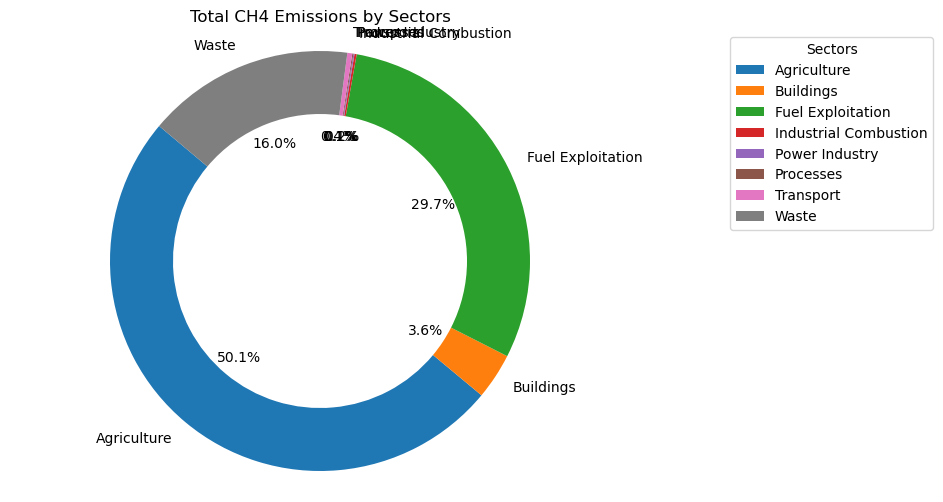

In [192]:
# Create a pie chart
plt.figure(figsize=(8, 6))
# Create the pie chart
wedges, texts, autotexts = plt.pie(
    global_total_emissions_CH4['Total_Emissions'],
    labels= global_total_emissions_CH4['Sector'],
    autopct='%1.1f%%',
    startangle=140,
    radius=1.0,  # Adjust this value to change the size of the donut hole
    wedgeprops=dict(width=0.3)  # This makes the donut shape
)

# Set the title
plt.title('Total CH4 Emissions by Sectors')
plt.axis('equal')  # Equal aspect ratio ensures that pie chart is circular.

# Create legend
plt.legend(wedges, global_total_emissions_CH4['Sector'], title="Sectors", loc="best", bbox_to_anchor=(1, 0, 0.5, 1))

# Show the chart
plt.show()

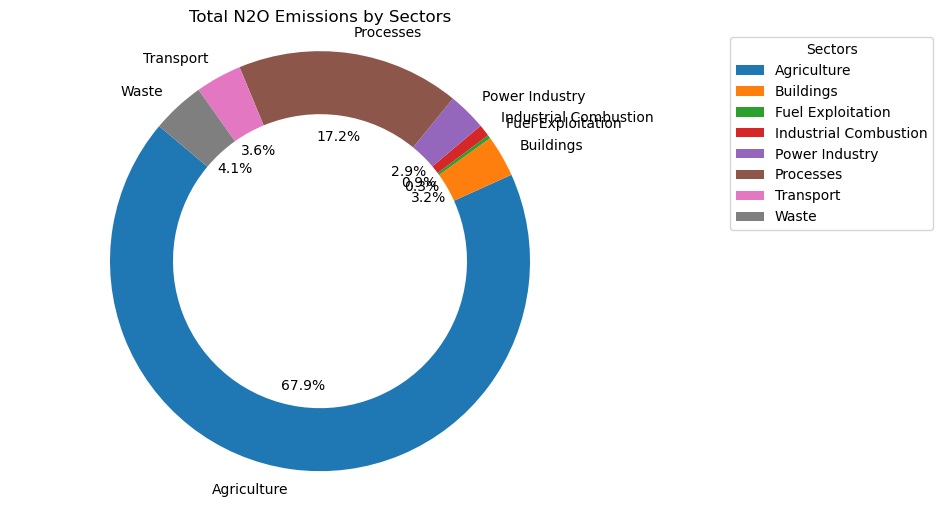

In [193]:
# Create a pie chart
plt.figure(figsize=(8, 6))
# Create the pie chart with a hole for donut chart
wedges, texts, autotexts = plt.pie(
    global_total_emissions_N2O['Total_Emissions'],
    labels= global_total_emissions_N2O['Sector'],
    autopct='%1.1f%%',
    startangle=140,
    radius=1.0,  # Adjust this value to change the size of the donut hole
    wedgeprops=dict(width=0.3)  # This makes the donut shape
)

# Set the title
plt.title('Total N2O Emissions by Sectors')
plt.axis('equal')  # Equal aspect ratio ensures that pie chart is circular.

# Create legend
plt.legend(wedges, global_total_emissions_N2O['Sector'], title="Sectors", loc="best", bbox_to_anchor=(1, 0, 0.5, 1))

# Show the chart
plt.show()

In [194]:
print(global_total_emissions_CO2.info())

<class 'pandas.core.frame.DataFrame'>
Index: 8 entries, 4828 to 4835
Data columns (total 57 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Substance        8 non-null      object 
 1   Sector           8 non-null      object 
 2   1970             8 non-null      float64
 3   1971             8 non-null      float64
 4   1972             8 non-null      float64
 5   1973             8 non-null      float64
 6   1974             8 non-null      float64
 7   1975             8 non-null      float64
 8   1976             8 non-null      float64
 9   1977             8 non-null      float64
 10  1978             8 non-null      float64
 11  1979             8 non-null      float64
 12  1980             8 non-null      float64
 13  1981             8 non-null      float64
 14  1982             8 non-null      float64
 15  1983             8 non-null      float64
 16  1984             8 non-null      float64
 17  1985             8 

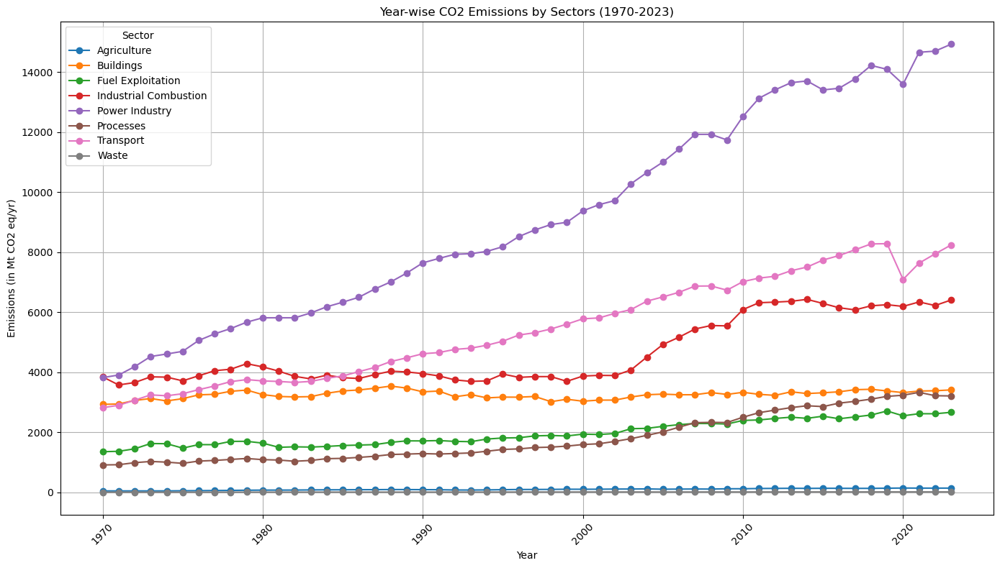

In [195]:
# Create a new DataFrame containing only the 'Sector' and year columns
years = [year for year in range(1970, 2024)]  # Adjust the range as needed
new_df_CO2 = global_total_emissions_CO2[['Sector'] + years]

# Set the figure size
plt.figure(figsize=(14, 8))

# Loop through each sector to plot the trend line
for index, row in new_df_CO2.iterrows():
    sector = row['Sector']
    emissions = row[1:].values  # Get emissions values (exclude 'Sector' column)
    
    plt.plot(years, emissions, marker='o', label=sector)

# Customize the plot
plt.title('Year-wise CO2 Emissions by Sectors (1970-2023)')
plt.xlabel('Year')
plt.ylabel('Emissions (in Mt CO2 eq/yr)')
plt.xticks(rotation=45)
plt.legend(title='Sector')
plt.grid()

# Show the plot
plt.tight_layout()
plt.show()

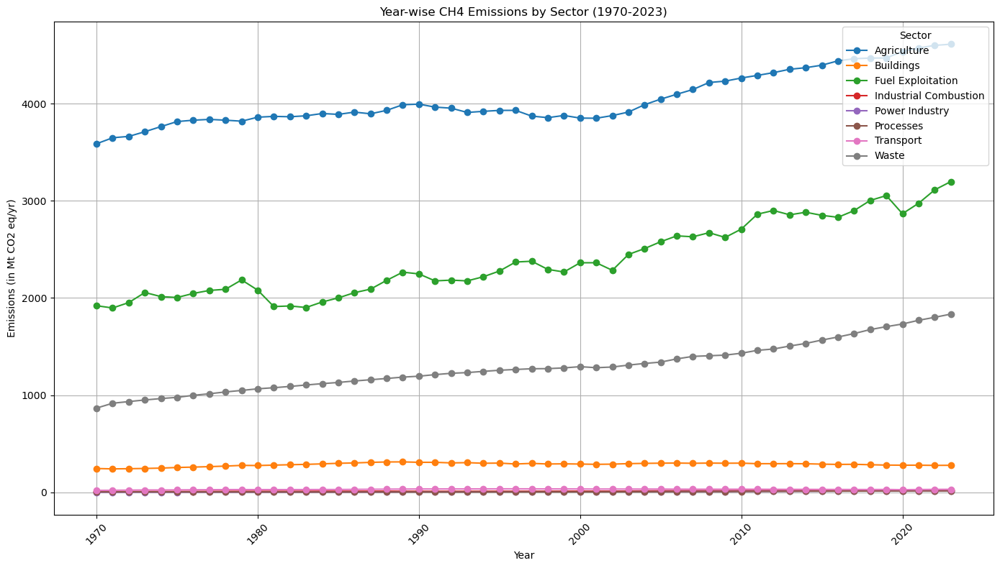

In [196]:
# Create a new DataFrame containing only the 'Sector' and year columns
years = [year for year in range(1970, 2024)]  # Adjust the range as needed
new_df_CH4 = global_total_emissions_CH4[['Sector'] + years]

# Set the figure size
plt.figure(figsize=(14, 8))

# Loop through each sector to plot the trend line
for index, row in new_df_CH4.iterrows():
    sector = row['Sector']
    emissions = row[1:].values  # Get emissions values (exclude 'Sector' column)
    
    plt.plot(years, emissions, marker='o', label=sector)

# Customize the plot
plt.title('Year-wise CH4 Emissions by Sector (1970-2023)')
plt.xlabel('Year')
plt.ylabel('Emissions (in Mt CO2 eq/yr)')
plt.xticks(rotation=45)
plt.legend(title='Sector')
plt.grid()

# Show the plot
plt.tight_layout()
plt.show()

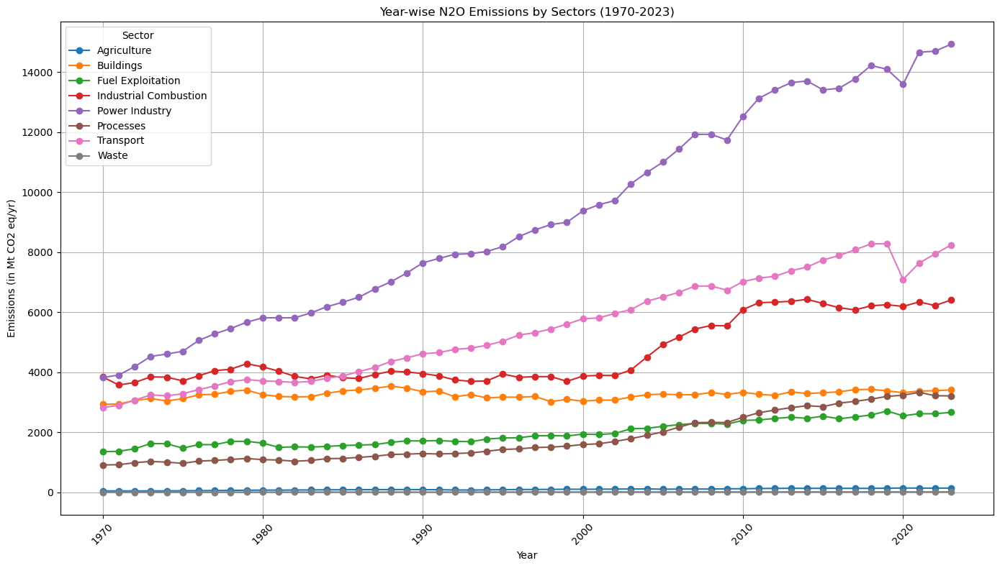

In [197]:
# Create a new DataFrame containing only the 'Sector' and year columns
years = [year for year in range(1970, 2024)]  # Adjust the range as needed
new_df_N2O = global_total_emissions_CO2[['Sector'] + years]

# Set the figure size
plt.figure(figsize=(14, 8))

# Loop through each sector to plot the trend line
for index, row in new_df_N2O.iterrows():
    sector = row['Sector']
    emissions = row[1:].values  # Get emissions values (exclude 'Sector' column)
    
    plt.plot(years, emissions, marker='o', label=sector)

# Customize the plot
plt.title('Year-wise N2O Emissions by Sectors (1970-2023)')
plt.xlabel('Year')
plt.ylabel('Emissions (in Mt CO2 eq/yr)')
plt.xticks(rotation=45)
plt.legend(title='Sector')
plt.grid()

# Show the plot
plt.tight_layout()
plt.show()

In [198]:
data_1 = {
    'Substance': ['CO2', 'CH4', 'Fluorinated Gases', 'N2O'],
    'Emissions': [1424121.725, 435465.0552, 32131.77248, 107317.7085]
}
global_total_emissions_all_gases = pd.DataFrame(data_1)

# Calculate the total emissions
total_emissions = global_total_emissions_all_gases['Emissions'].sum()

# Add the Average Percentage column
global_total_emissions_all_gases['Average Percentage (%)'] = ((global_total_emissions_all_gases['Emissions'] / total_emissions) * 100).round(2)

print(global_total_emissions_all_gases)
print("\n Mt CO2eq/yr: Megatonnes Carbon Dioxide equivalent per year")

           Substance     Emissions  Average Percentage (%)
0                CO2  1.424122e+06                   71.24
1                CH4  4.354651e+05                   21.78
2  Fluorinated Gases  3.213177e+04                    1.61
3                N2O  1.073177e+05                    5.37

 Mt CO2eq/yr: Megatonnes Carbon Dioxide equivalent per year


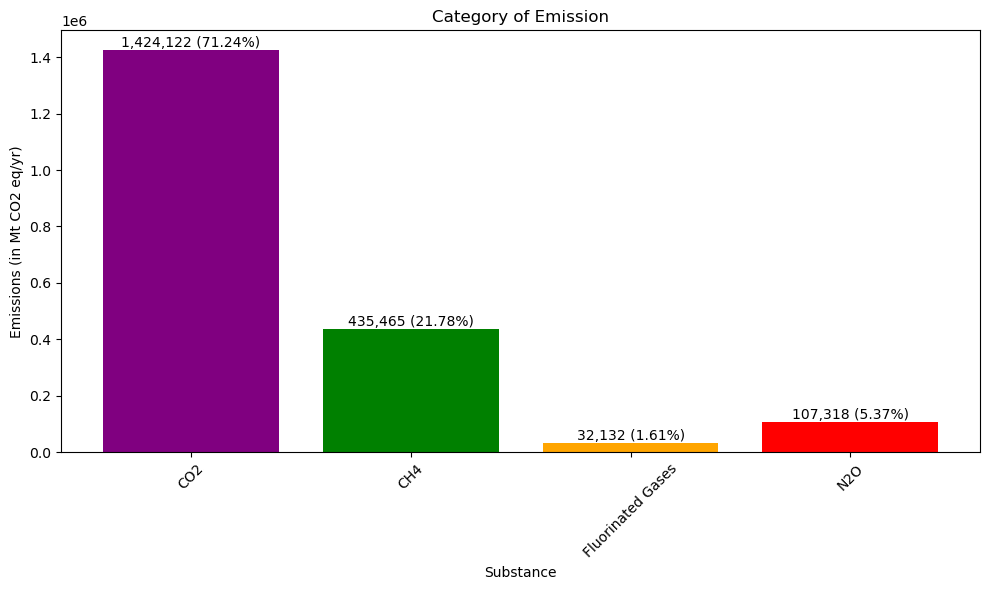

In [199]:
# Plot
plt.figure(figsize=(10, 6))
bars = plt.bar(global_total_emissions_all_gases['Substance'], 
               global_total_emissions_all_gases['Emissions'], 
               color=['purple', 'green', 'orange', 'red'])

plt.xlabel('Substance')
plt.ylabel('Emissions (in Mt CO2 eq/yr)')
plt.title('Category of Emission')
plt.xticks(rotation=45)

# Adding data labels on the bars
for i, bar in enumerate(bars):
    emissions = global_total_emissions_all_gases.loc[i, 'Emissions']
    avg_percentage = global_total_emissions_all_gases.loc[i, 'Average Percentage (%)']
    label = f'{emissions:,.0f} ({avg_percentage:.2f}%)'  # Emissions with Average Percentage
    plt.text(bar.get_x() + bar.get_width() / 2,  # Horizontal position
             bar.get_height(),  # Vertical position (top of the bar)
             label,  # Formatted label
             ha='center',  # Center align
             va='bottom',  # Align the text above the bar
             color='black')

# Show the plot
plt.tight_layout()
plt.show()


In [200]:
data_2 = {
    'Sector': ['Agriculture', 'Buildings', 'Fuel Exploitation', 'Industrial Combustion', 'Power Industry', 'Processes', 'Transport', 'Waste'],
    'Emissions': [296242.922, 194710.0852, 235671.4778, 252631.3917, 497755.3912, 148070.7101, 299343.453, 74610.83006]
}
global_Emissions_by_Sector = pd.DataFrame(data_2)

# Sort the DataFrame by emissions in descending order
global_Emissions_by_Sector = global_Emissions_by_Sector.sort_values('Emissions', ascending=False)

# Calculate the total emissions
total_emissions = global_Emissions_by_Sector['Emissions'].sum()

# Add the Average Percentage column
global_Emissions_by_Sector['Average Percentage (%)'] = ((global_Emissions_by_Sector['Emissions'] / total_emissions) * 100).round(2)

print(global_Emissions_by_Sector)
print("\n Mt CO2eq/yr : Megatonnes Carbon Dioxide equivalent per year")

                  Sector     Emissions  Average Percentage (%)
4         Power Industry  497755.39120                   24.90
6              Transport  299343.45300                   14.97
0            Agriculture  296242.92200                   14.82
3  Industrial Combustion  252631.39170                   12.64
2      Fuel Exploitation  235671.47780                   11.79
1              Buildings  194710.08520                    9.74
5              Processes  148070.71010                    7.41
7                  Waste   74610.83006                    3.73

 Mt CO2eq/yr : Megatonnes Carbon Dioxide equivalent per year


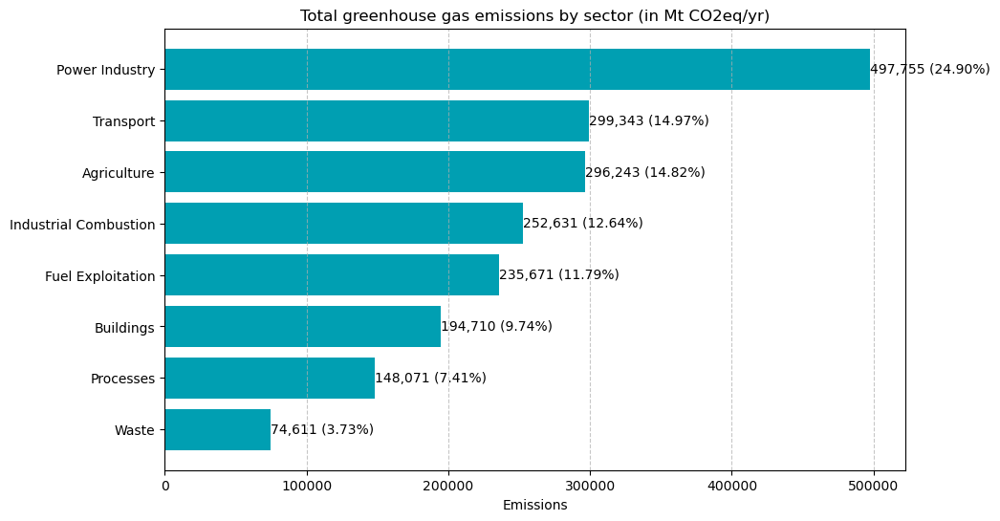

In [201]:
plt.figure(figsize=(10, 6))
bars = plt.barh(global_Emissions_by_Sector['Sector'], global_Emissions_by_Sector['Emissions'], color='#009fb2')
plt.xlabel('Emissions')
plt.title('Total greenhouse gas emissions by sector (in Mt CO2eq/yr)')
plt.grid(axis='x', linestyle='--', alpha=0.7)

# Invert the y-axis to have the largest bar on top
plt.gca().invert_yaxis()

# Adding value labels to each bar (Emissions and Average Percentage)
for bar, percentage in zip(bars, global_Emissions_by_Sector['Average Percentage (%)']):
    plt.text(bar.get_width(), bar.get_y() + bar.get_height() / 2, 
             f'{bar.get_width():,.0f} ({percentage:.2f}%)', 
             va='center', ha='left', color='black')

# Show plot
plt.show()


In [202]:
CountryWise_Emissions_by_Sector = df_2.head(4801)

# Calculate the row-wise sum for the selected columns
CountryWise_Emissions_by_Sector['Total_Emissions'] = CountryWise_Emissions_by_Sector.iloc[:, 5:58].sum(axis=1)

print(CountryWise_Emissions_by_Sector.head(3))

  Substance       Sector EDGAR Country Code      Country      1970      1971  \
0       CO2  Agriculture                AFG  Afghanistan  0.029229  0.029229   
1       CO2  Agriculture                ALB      Albania  0.113300  0.113300   
2       CO2  Agriculture                ARG    Argentina  0.104343  0.104343   

       1972      1973      1974      1975  ...      2015      2016      2017  \
0  0.029229  0.029229  0.039967  0.045310  ...  0.116967  0.163009  0.311300   
1  0.113300  0.113300  0.113614  0.112514  ...  0.056519  0.047405  0.054162   
2  0.104343  0.104343  0.087214  0.077314  ...  0.892257  1.385790  1.278409   

       2018      2019      2020      2021      2022      2023  Total_Emissions  
0  0.161333  0.151276  0.064795  0.046692  0.023617  0.015142         2.893332  
1  0.046462  0.066419  0.060552  0.048348  0.048536  0.048955         4.295667  
2  1.592119  1.703062  1.925471  2.124204  2.270616  2.405894        38.461854  

[3 rows x 59 columns]


C:\Users\Anwesh\AppData\Local\Temp\ipykernel_11540\3375603213.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [204]:
# Get unique sectors and substances
substances = CountryWise_Emissions_by_Sector['Substance'].unique()
sectors = CountryWise_Emissions_by_Sector['Sector'].unique()

# Create a dictionary to store top countries by sector and substance
top_countries_by_sector = {}

# Loop through each substance
for substance in substances:
    # Filter data for the specific substance
    subset_by_substance = CountryWise_Emissions_by_Sector[CountryWise_Emissions_by_Sector['Substance'] == substance]
    
    # Loop through each sector
    for sector in sectors:
        # Filter data for the sector within the filtered substance
        subset = subset_by_substance[subset_by_substance['Sector'] == sector]
        
        # Sort by Total_Emissions and get top 10
        top_countries = subset.sort_values(by='Total_Emissions', ascending=False).head(10)
        
        # Store the result in the dictionary
        top_countries_by_sector[(substance, sector)] = top_countries[['Country', 'Total_Emissions']]

# Display results
for (substance, sector), countries in top_countries_by_sector.items():
    print(f"Top countries for {substance} emissions in sector {sector}:\n")
    print(countries.to_string(index=False))  # Hide the index
    print("\n Mt CO2eq/yr: Megatonnes Carbon Dioxide equivalent per year \n")

Top countries for CO2 emissions in sector Agriculture:

          Country  Total_Emissions
            China       916.445395
            India       840.596803
    United States       266.074771
           Brazil       256.691029
           Russia       229.287556
        Indonesia       186.772693
France and Monaco       169.361350
         Pakistan       162.431377
           Mexico       143.631991
           Poland       119.260654

 Mt CO2eq/yr: Megatonnes Carbon Dioxide equivalent per year 

Top countries for CO2 emissions in sector Buildings:

          Country  Total_Emissions
    United States     34684.996767
            China     25552.784581
           Russia     13521.629568
          Germany     10237.956866
            Japan      7433.694926
            India      5791.730230
   United Kingdom      5706.880945
France and Monaco      5364.234744
             Iran      4714.107613
           Canada      4547.037261

 Mt CO2eq/yr: Megatonnes Carbon Dioxide equivalent per y

In [205]:
# Load the specific sheet (replace 'YourSheetName' with the actual name of the sheet you want to use)
df_3 = pd.read_excel(excel_file, sheet_name = 'GHG_per_GDP_by_country')

In [206]:
df_3

,EDGAR Country Code,Country,1990,1991,1992,1993,1994,1995,1996,1997,...,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
0,ABW,Aruba,0.101289,0.105142,0.109428,0.102559,0.107101,0.114475,0.076649,0.115067,...,0.121064,0.127409,0.131262,0.118235,0.115343,0.140330,0.151117,0.130436,0.118620,0.118539
1,AFG,Afghanistan,0.235479,0.265678,0.241176,0.324220,0.417877,0.283912,0.330616,0.375493,...,0.277066,0.272985,0.259409,0.262758,0.258370,0.243496,0.246249,0.322302,0.355828,0.383209
2,AGO,Angola,0.371659,0.364947,0.374160,0.555379,0.721907,0.726558,0.770904,0.749141,...,0.277629,0.290972,0.288089,0.268573,0.257627,0.260965,0.243998,0.251774,0.254962,0.254641
3,AIA,Anguilla,0.028943,0.045075,0.035441,0.041589,0.051703,0.063177,0.064996,0.055839,...,0.098223,0.113918,0.127597,0.150618,0.190672,0.124424,0.111727,0.102503,0.089842,0.082970
4,ALB,Albania,0.650255,0.710074,0.520889,0.478346,0.491437,0.411140,0.361446,0.356990,...,0.238624,0.229252,0.212162,0.224141,0.215217,0.198510,0.189777,0.183612,0.162943,0.154736
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
207,ZWE,Zimbabwe,0.810617,0.767518,0.866409,0.747775,0.664890,0.661093,0.627597,0.591945,...,0.585665,0.595381,0.554926,0.523410,0.534563,0.541351,0.554162,0.551124,0.534346,0.529494
208,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
209,EU27,EU27,0.343439,0.335138,0.320795,0.316624,0.307527,0.302443,0.303747,0.290971,...,0.184814,0.183105,0.179920,0.175708,0.168236,0.158442,0.154753,0.154060,0.144794,0.133259
210,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [207]:
global_emissions_per_GDP = df_3.tail(1)
global_emissions_per_GDP = global_emissions_per_GDP.drop(columns= 'EDGAR Country Code')
global_emissions_per_GDP = global_emissions_per_GDP.drop(columns= 'Country')

In [208]:
global_emissions_per_GDP

,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,...,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
211,0.543242,0.53928,0.531207,0.524855,0.51719,0.514428,0.505779,0.492448,0.481741,0.468539,...,0.381552,0.368724,0.359462,0.352429,0.348211,0.340435,0.337486,0.331676,0.323571,0.319729


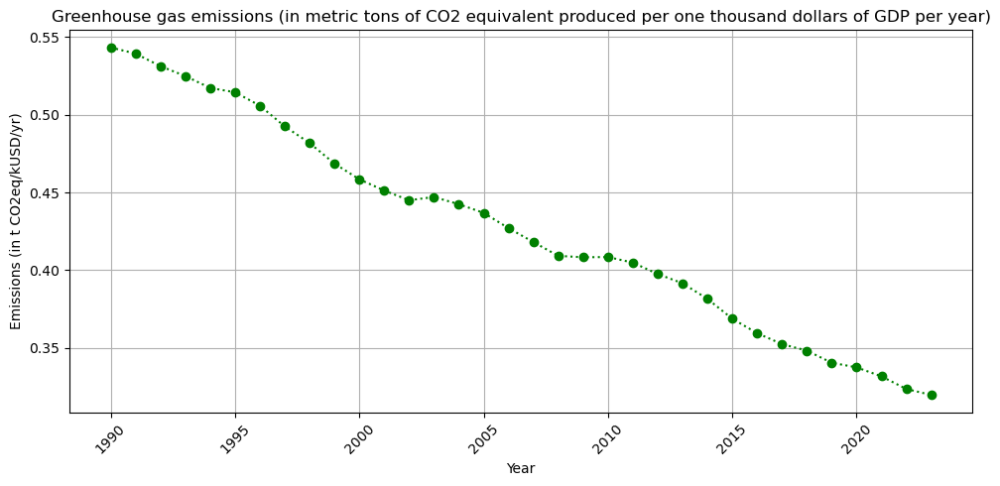

In [209]:
# Transpose the DataFrame to plot the years as x-axis
global_emissions_per_GDP_transpose = global_emissions_per_GDP.T

# Plotting the line graph
plt.figure(figsize=(10, 5))
plt.plot(global_emissions_per_GDP_transpose.index, global_emissions_per_GDP_transpose.values, color = 'green', linestyle = ':', marker='o')
plt.title('Greenhouse gas emissions (in metric tons of CO2 equivalent produced per one thousand dollars of GDP per year)')
plt.xlabel('Year')
plt.ylabel('Emissions (in t CO2eq/kUSD/yr)')
plt.xticks(rotation=45)  # Rotate x labels for better readability
plt.grid()
plt.tight_layout()  # Adjust layout to make room for the rotated x labels
plt.show()

In [210]:
df_3 = df_3.drop(columns = 'EDGAR Country Code')

In [211]:
df_3

,Country,1990,1991,1992,1993,1994,1995,1996,1997,1998,...,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
0,Aruba,0.101289,0.105142,0.109428,0.102559,0.107101,0.114475,0.076649,0.115067,0.115596,...,0.121064,0.127409,0.131262,0.118235,0.115343,0.140330,0.151117,0.130436,0.118620,0.118539
1,Afghanistan,0.235479,0.265678,0.241176,0.324220,0.417877,0.283912,0.330616,0.375493,0.416162,...,0.277066,0.272985,0.259409,0.262758,0.258370,0.243496,0.246249,0.322302,0.355828,0.383209
2,Angola,0.371659,0.364947,0.374160,0.555379,0.721907,0.726558,0.770904,0.749141,0.771053,...,0.277629,0.290972,0.288089,0.268573,0.257627,0.260965,0.243998,0.251774,0.254962,0.254641
3,Anguilla,0.028943,0.045075,0.035441,0.041589,0.051703,0.063177,0.064996,0.055839,0.045076,...,0.098223,0.113918,0.127597,0.150618,0.190672,0.124424,0.111727,0.102503,0.089842,0.082970
4,Albania,0.650255,0.710074,0.520889,0.478346,0.491437,0.411140,0.361446,0.356990,0.343502,...,0.238624,0.229252,0.212162,0.224141,0.215217,0.198510,0.189777,0.183612,0.162943,0.154736
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
207,Zimbabwe,0.810617,0.767518,0.866409,0.747775,0.664890,0.661093,0.627597,0.591945,0.592107,...,0.585665,0.595381,0.554926,0.523410,0.534563,0.541351,0.554162,0.551124,0.534346,0.529494
208,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
209,EU27,0.343439,0.335138,0.320795,0.316624,0.307527,0.302443,0.303747,0.290971,0.279605,...,0.184814,0.183105,0.179920,0.175708,0.168236,0.158442,0.154753,0.154060,0.144794,0.133259
210,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [212]:
# Set 'Country' as the index
df_3.set_index('Country', inplace=True)

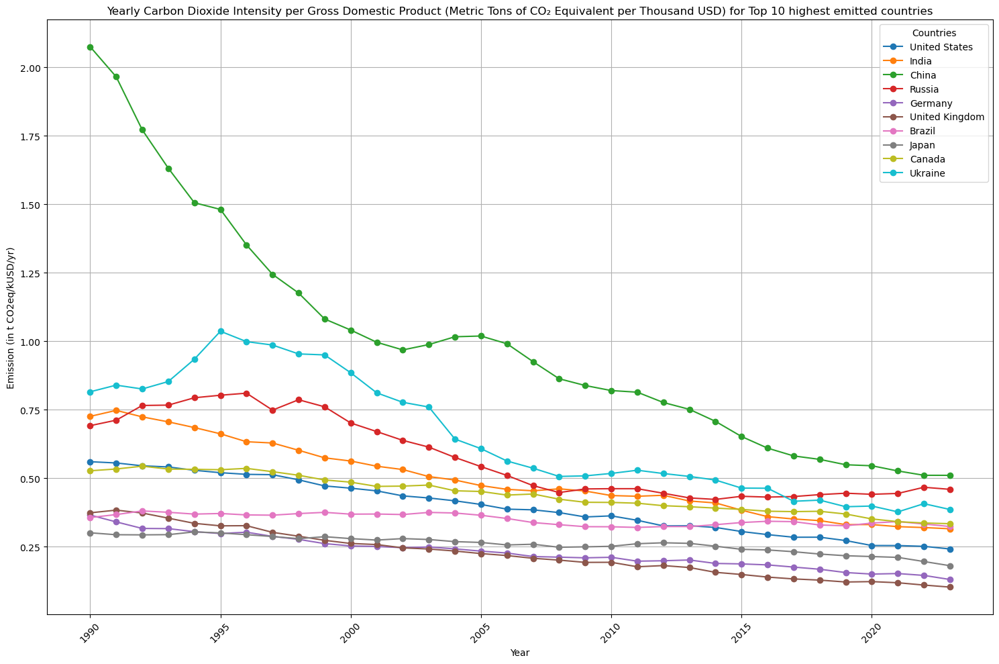

In [214]:
# Select all year columns for plotting
year_columns = df_3.columns  # This selects all columns except 'Country'

# Filter DataFrame for the specified countries
selected_countries = ["United States", "India", "China", "Russia", "Germany", 
                      "United Kingdom", "Brazil", "Japan", "Canada", "Ukraine"]

# Create a new DataFrame with the selected countries
df_selected = df_3.loc[selected_countries]

# Transpose the DataFrame to have years as index
df_3_transposed = df_selected.T

# Plotting the multi-line graph
plt.figure(figsize=(15, 10))
for country in df_3_transposed.columns:
    plt.plot(df_3_transposed.index, df_3_transposed[country], marker='o', label=country)

# Adding titles and labels
plt.title('Yearly Carbon Dioxide Intensity per Gross Domestic Product (Metric Tons of CO₂ Equivalent per Thousand USD) for Top 10 highest emitted countries')
plt.xlabel('Year')
plt.ylabel('Emission (in t CO2eq/kUSD/yr)')
plt.xticks(rotation=45)  # Rotate x labels for better readability
plt.legend(title='Countries')
plt.grid()
plt.tight_layout()  # Adjust layout to make room for the rotated x labels
plt.show()

In [215]:
# Load the specific sheet (replace 'YourSheetName' with the actual name of the sheet you want to use)
df_4 = pd.read_excel(excel_file, sheet_name = 'GHG_per_capita_by_country')

In [216]:
df_4

,EDGAR Country Code,Country,1970,1971,1972,1973,1974,1975,1976,1977,...,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
0,ABW,Aruba,0.621591,0.698825,0.875514,0.952142,0.935603,1.166287,1.151959,1.335586,...,4.523035,4.705631,4.908697,4.713297,4.689429,5.553807,4.529961,4.964500,4.986945,5.199052
1,AFG,Afghanistan,1.387497,1.345625,1.136047,1.158556,1.231819,1.258354,1.241663,1.231162,...,0.837051,0.812424,0.768525,0.779393,0.757517,0.725168,0.700207,0.710363,0.719308,0.724742
2,AGO,Angola,2.803674,2.723448,3.024597,3.162829,3.168898,2.931294,2.352391,2.859557,...,2.871258,2.935287,2.737463,2.465213,2.258536,2.199314,1.878921,1.900307,1.920968,1.874900
3,AIA,Anguilla,0.523981,0.526423,0.543562,0.520344,0.560073,0.598576,0.575509,0.592212,...,2.158513,2.144561,2.149043,2.178249,2.099982,2.039524,1.703662,1.681618,1.671227,1.638172
4,ALB,Albania,3.824444,3.710615,4.039683,3.723085,3.754264,3.746380,3.913496,4.051386,...,3.047044,2.989698,2.855613,3.127462,3.119193,2.933062,2.708112,2.851648,2.650839,2.603893
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
207,ZWE,Zimbabwe,4.197291,4.171122,3.967215,4.115530,3.995208,3.755530,3.819580,3.583973,...,1.889668,1.914451,1.758873,1.687033,1.768289,1.640084,1.514136,1.599026,1.617606,1.648735
208,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
209,EU27,EU27,11.904374,11.888450,12.198409,12.675477,12.495636,12.203139,12.796095,12.702648,...,8.657854,8.775783,8.791448,8.836058,8.644674,8.294612,7.637954,8.062230,7.849388,7.264098
210,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [217]:
global_emissions_per_capita = df_4.tail(1)

In [218]:
global_emissions_per_capita = global_emissions_per_capita.drop(columns = ['EDGAR Country Code', 'Country'])

In [219]:
global_emissions_per_capita

,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,...,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
211,6.487569,6.370439,6.484807,6.668542,6.541291,6.423029,6.578672,6.619844,6.667915,6.709478,...,6.705892,6.612758,6.571992,6.608325,6.687457,6.649377,6.330138,6.548488,6.53377,6.594133


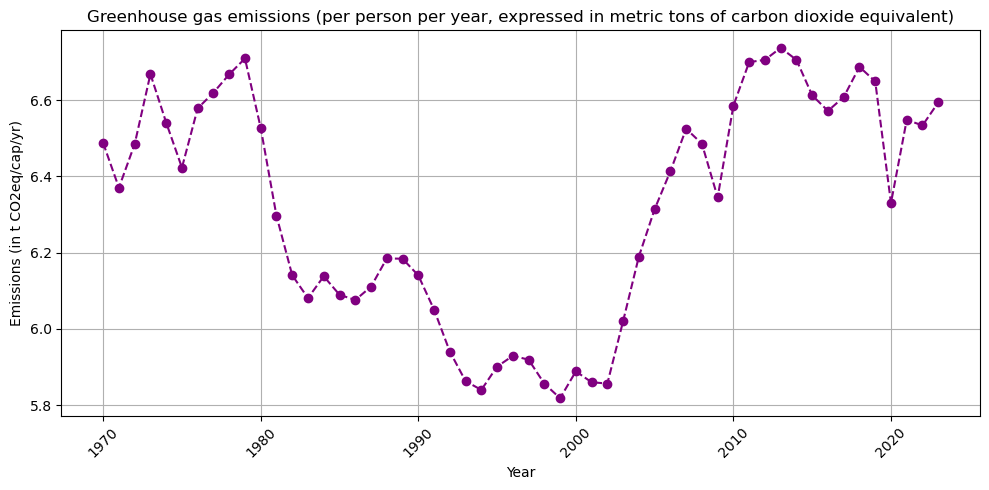

In [220]:
# Transpose the DataFrame to plot the years as x-axis
global_emissions_per_capita_transpose = global_emissions_per_capita.T

# Plotting the line graph
plt.figure(figsize=(10, 5))
plt.plot(global_emissions_per_capita_transpose.index, global_emissions_per_capita_transpose.values, color = 'purple', linestyle = '--', marker='o')
plt.title('Greenhouse gas emissions (per person per year, expressed in metric tons of carbon dioxide equivalent)')
plt.xlabel('Year')
plt.ylabel('Emissions (in t CO2eq/cap/yr)')
plt.xticks(rotation=45)  # Rotate x labels for better readability
plt.grid()
plt.tight_layout()  # Adjust layout to make room for the rotated x labels
plt.show()

In [221]:
df_4 = df_4.drop(columns = 'EDGAR Country Code')

In [222]:
# Set 'Country' as the index
df_4.set_index('Country', inplace=True)

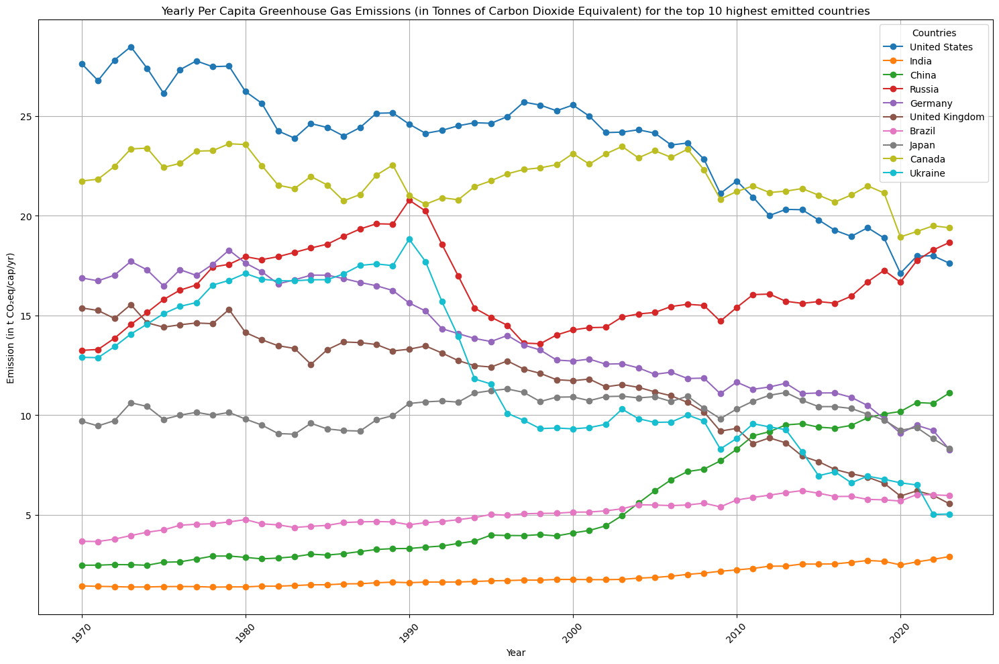

In [223]:
# Select all year columns for plotting
year_columns = df_4.columns  # This selects all columns except 'Country'

# Filter DataFrame for the specified countries
selected_countries = ["United States", "India", "China", "Russia", "Germany", 
                      "United Kingdom", "Brazil", "Japan", "Canada", "Ukraine"]

# Create a new DataFrame with the selected countries
df_selected = df_4.loc[selected_countries]

# Transpose the DataFrame to have years as index
df_4_transposed = df_selected.T

# Plotting the multi-line graph
plt.figure(figsize=(15, 10))
for country in df_4_transposed.columns:
    plt.plot(df_4_transposed.index, df_4_transposed[country], marker='o', label=country)

# Adding titles and labels
plt.title('Yearly Per Capita Greenhouse Gas Emissions (in Tonnes of Carbon Dioxide Equivalent) for the top 10 highest emitted countries')
plt.xlabel('Year')
plt.ylabel('Emission (in t CO₂eq/cap/yr)')
plt.xticks(rotation=45)  # Rotate x labels for better readability
plt.legend(title='Countries')
plt.grid()
plt.tight_layout()  # Adjust layout to make room for the rotated x labels
plt.show()

In [224]:
# Load the specific sheet (replace 'YourSheetName' with the actual name of the sheet you want to use)
df_5 = pd.read_excel(excel_file, sheet_name = 'LULUCF_macroregions')

In [225]:
df_5

,Substance,Macro-region,Sector,1990,1991,1992,1993,1994,1995,1996,...,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
0,CO2,Africa,Deforestation,1356.088018,1356.888101,1363.322299,1356.097241,1354.520550,1362.475729,1362.312993,...,2004.081318,1607.369760,1624.969234,1624.214156,1631.465836,1636.420938,1636.763928,1635.736375,1635.736375,1635.736375
1,CO2,Africa,Fires,125.899474,108.362678,122.673040,193.623094,124.398526,124.398526,138.627940,...,88.523031,98.353047,105.096012,141.467317,88.386973,77.704920,147.937510,244.122486,178.426012,212.587891
2,GWP_100_AR5_CH4,Africa,Fires,374.247333,333.594153,329.216425,399.180376,342.055898,342.055898,368.673903,...,229.061622,271.410749,293.528399,276.097508,324.981482,284.102292,250.245280,231.341794,249.535881,209.791533
3,GWP_100_AR5_N2O,Africa,Fires,117.806622,111.637525,117.527870,123.423303,110.952673,110.952673,126.433626,...,85.411082,90.114448,99.334942,87.478348,85.160903,76.634618,88.192806,89.767993,89.856337,75.573986
4,CO2,Africa,Forest Land,-2511.116828,-2271.792539,-2175.060098,-2071.792273,-1962.607111,-1860.515955,-1811.604588,...,-998.857865,-941.177313,-935.573798,-894.484378,-854.229365,-833.967645,-791.410956,-719.969030,-696.495794,-650.868270
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
89,GWP_100_AR5_N2O,GLOBAL TOTAL,Fires,205.827266,214.429836,222.838442,252.225216,219.778878,219.778878,227.208155,...,153.314306,158.724870,150.619516,164.031046,149.463222,153.870337,154.212042,149.602138,140.288667,166.680166
90,CO2,GLOBAL TOTAL,Forest Land,-7725.508359,-7569.565591,-7518.130083,-7596.496293,-7536.130265,-7336.808117,-7368.303175,...,-5727.999306,-5815.360945,-5871.962542,-5781.917362,-5418.444440,-5594.315376,-5556.070311,-5132.022201,-5183.880301,-5129.577479
91,CO2,GLOBAL TOTAL,Organic Soil,637.681647,636.198072,633.995519,632.019407,630.133149,629.162804,627.781406,...,1266.506595,1496.271698,769.730736,693.889697,806.468244,1152.481802,1154.090884,1154.090884,1154.090884,1154.090884
92,CO2,GLOBAL TOTAL,Other Land,-690.251846,-671.638187,-690.573137,-694.922063,-773.039024,-788.948448,-835.072586,...,-1030.163545,-949.471493,-1159.992772,-1209.363173,-1142.734857,-1096.096635,-1186.982069,-1152.505978,-1152.505978,-1152.505978


In [226]:
global_net_emissions_macroregions = df_5.tail(1)
global_net_emissions_macroregions = global_net_emissions_macroregions.drop(columns = ['Substance', 'Macro-region', 'Sector'])

In [227]:
global_net_emissions_macroregions

,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,...,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
93,-1383.403715,-1342.652596,-1191.786901,-854.652514,-1005.271609,145.479297,-957.936414,-1992.630777,-727.872023,-609.219267,...,68.95186,410.060332,-1182.939915,-759.685364,-41.676445,-0.000525,-456.116575,169.472899,-130.406874,1537.805827


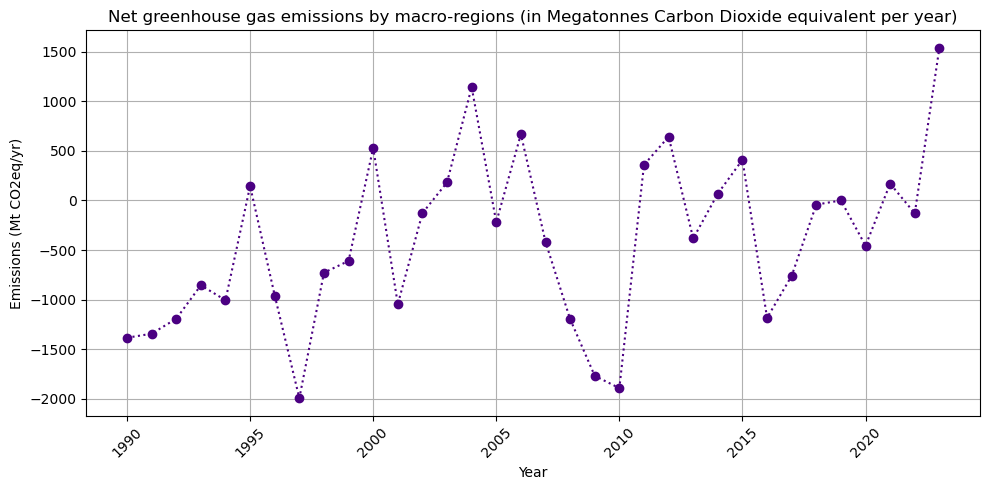

In [229]:
# Transpose the DataFrame to plot the years as x-axis
global_net_emissions_macroregions_transpose = global_net_emissions_macroregions.T

# Plotting the line graph
plt.figure(figsize=(10, 5))
plt.plot(global_net_emissions_macroregions_transpose.index, global_net_emissions_macroregions_transpose.values, color = 'indigo', linestyle = ':', marker='o')
plt.title('Net greenhouse gas emissions by macro-regions (in Megatonnes Carbon Dioxide equivalent per year)')
plt.xlabel('Year')
plt.ylabel('Emissions (Mt CO2eq/yr)')
plt.xticks(rotation=45)  # Rotate x labels for better readability
plt.grid()
plt.tight_layout()  # Adjust layout to make room for the rotated x labels
plt.show()

In [230]:
net_global_emissions_by_macroregions = df_5.iloc[-8:-1, :]

In [231]:
net_global_emissions_by_macroregions = net_global_emissions_by_macroregions.drop(columns = 'Macro-region')

In [232]:
net_global_emissions_by_macroregions = net_global_emissions_by_macroregions.drop(columns = 'Substance')

In [233]:
net_global_emissions_by_macroregions

,Sector,1990,1991,1992,1993,1994,1995,1996,1997,1998,...,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
86,Deforestation,4243.792075,4011.135060,4151.942762,4155.404189,4148.612081,5116.920607,4492.264775,4189.103100,4459.590924,...,3880.068933,4050.735636,3850.796690,3816.526160,3938.518429,3811.667203,3862.060945,3877.818341,3877.818341,3877.818341
87,Fires,1317.971019,1367.704474,1344.534873,1587.044709,1651.565379,1651.565379,1254.110633,717.944645,1283.263838,...,939.183829,836.560249,579.976042,1091.122047,1055.701659,923.232657,661.841689,845.223259,635.779451,1992.039174
88,Fires,627.084485,669.083739,663.604723,810.072321,653.808194,653.808194,644.074377,349.616411,695.885107,...,588.041047,632.600317,497.892413,466.026220,569.351297,649.159487,454.730244,427.266456,398.002062,629.260718
89,Fires,205.827266,214.429836,222.838442,252.225216,219.778878,219.778878,227.208155,122.148909,212.446326,...,153.314306,158.724870,150.619516,164.031046,149.463222,153.870337,154.212042,149.602138,140.288667,166.680166
90,Forest Land,-7725.508359,-7569.565591,-7518.130083,-7596.496293,-7536.130265,-7336.808117,-7368.303175,-7153.646051,-7126.771788,...,-5727.999306,-5815.360945,-5871.962542,-5781.917362,-5418.444440,-5594.315376,-5556.070311,-5132.022201,-5183.880301,-5129.577479
91,Organic Soil,637.681647,636.198072,633.995519,632.019407,630.133149,629.162804,627.781406,625.006082,623.548874,...,1266.506595,1496.271698,769.730736,693.889697,806.468244,1152.481802,1154.090884,1154.090884,1154.090884,1154.090884
92,Other Land,-690.251846,-671.638187,-690.573137,-694.922063,-773.039024,-788.948448,-835.072586,-842.803873,-875.835303,...,-1030.163545,-949.471493,-1159.992772,-1209.363173,-1142.734857,-1096.096635,-1186.982069,-1152.505978,-1152.505978,-1152.505978


In [234]:
# Select the rows containing "Fires"
selected_rows = net_global_emissions_by_macroregions[net_global_emissions_by_macroregions["Sector"] == "Fires"]

# Calculate the sum of these rows for numeric columns
summed_row = selected_rows.iloc[:, 1:].sum()

# Create a new row with the calculated sum
summed_row_data = ["Fires"] + summed_row.tolist()  # No "Substance" column here
summed_row_df = pd.DataFrame([summed_row_data], columns=net_global_emissions_by_macroregions.columns)

# Append the new row to the DataFrame
net_global_emissions_by_macroregions_agg = pd.concat([net_global_emissions_by_macroregions, summed_row_df], ignore_index=True)

# Display the updated DataFrame
print(net_global_emissions_by_macroregions_agg)

          Sector         1990         1991         1992         1993  \
0  Deforestation  4243.792075  4011.135060  4151.942762  4155.404189   
1          Fires  1317.971019  1367.704474  1344.534873  1587.044709   
2          Fires   627.084485   669.083739   663.604723   810.072321   
3          Fires   205.827266   214.429836   222.838442   252.225216   
4    Forest Land -7725.508359 -7569.565591 -7518.130083 -7596.496293   
5   Organic Soil   637.681647   636.198072   633.995519   632.019407   
6     Other Land  -690.251846  -671.638187  -690.573137  -694.922063   
7          Fires  2150.882770  2251.218050  2230.978037  2649.342246   

          1994         1995         1996         1997         1998  ...  \
0  4148.612081  5116.920607  4492.264775  4189.103100  4459.590924  ...   
1  1651.565379  1651.565379  1254.110633   717.944645  1283.263838  ...   
2   653.808194   653.808194   644.074377   349.616411   695.885107  ...   
3   219.778878   219.778878   227.208155   122.1489

In [235]:
# Drop the 2nd, 3rd, and 4th rows (indices 1, 2, 3)
rows_to_drop = [1, 2, 3]  # Indices of rows to drop
net_global_emissions_by_macroregions_agg = net_global_emissions_by_macroregions_agg.drop(rows_to_drop)

In [236]:
net_global_emissions_by_macroregions_agg

,Sector,1990,1991,1992,1993,1994,1995,1996,1997,1998,...,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
0,Deforestation,4243.792075,4011.135060,4151.942762,4155.404189,4148.612081,5116.920607,4492.264775,4189.103100,4459.590924,...,3880.068933,4050.735636,3850.796690,3816.526160,3938.518429,3811.667203,3862.060945,3877.818341,3877.818341,3877.818341
4,Forest Land,-7725.508359,-7569.565591,-7518.130083,-7596.496293,-7536.130265,-7336.808117,-7368.303175,-7153.646051,-7126.771788,...,-5727.999306,-5815.360945,-5871.962542,-5781.917362,-5418.444440,-5594.315376,-5556.070311,-5132.022201,-5183.880301,-5129.577479
5,Organic Soil,637.681647,636.198072,633.995519,632.019407,630.133149,629.162804,627.781406,625.006082,623.548874,...,1266.506595,1496.271698,769.730736,693.889697,806.468244,1152.481802,1154.090884,1154.090884,1154.090884,1154.090884
6,Other Land,-690.251846,-671.638187,-690.573137,-694.922063,-773.039024,-788.948448,-835.072586,-842.803873,-875.835303,...,-1030.163545,-949.471493,-1159.992772,-1209.363173,-1142.734857,-1096.096635,-1186.982069,-1152.505978,-1152.505978,-1152.505978
7,Fires,2150.882770,2251.218050,2230.978037,2649.342246,2525.152450,2525.152450,2125.393166,1189.709965,2191.595271,...,1680.539183,1627.885435,1228.487972,1721.179314,1774.516179,1726.262481,1270.783975,1422.091853,1174.070180,2787.980058


In [237]:
# Set the index to the 'Sector' column
net_global_emissions_by_macroregions_agg.set_index('Sector', inplace=True)

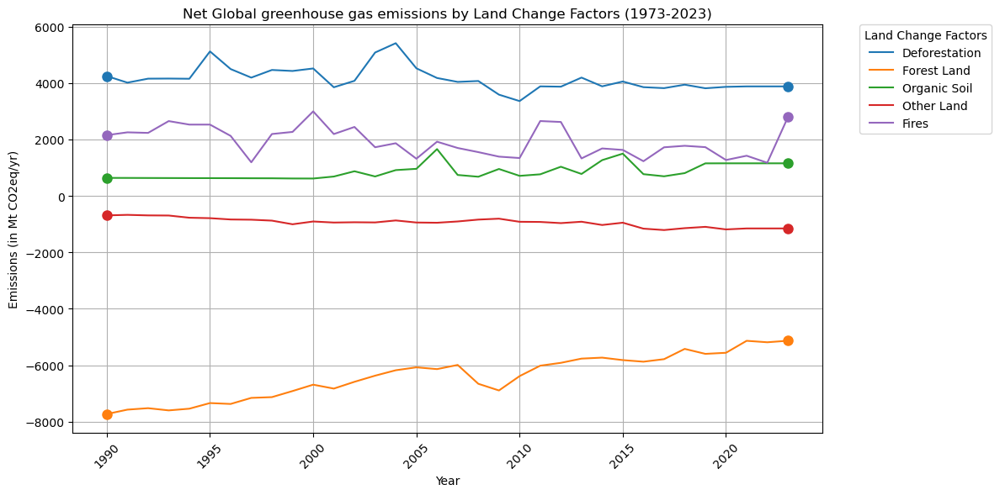

In [240]:
#Transpose
net_global_emissions_by_macroregions_agg_transposed = net_global_emissions_by_macroregions_agg.T

# Plotting the multi-line graph
plt.figure(figsize=(12, 6))  # Set the figure size
for sector in net_global_emissions_by_macroregions_agg_transposed.columns:
    # Plot the line and get the line object to retrieve its color
    line, = plt.plot(net_global_emissions_by_macroregions_agg_transposed.index, 
                     net_global_emissions_by_macroregions_agg_transposed[sector], 
                     label=sector)

    # Add markers for the first and last points with the same color as the line
    first_point = net_global_emissions_by_macroregions_agg_transposed[sector].iloc[0]
    last_point = net_global_emissions_by_macroregions_agg_transposed[sector].iloc[-1]
    
    plt.plot(net_global_emissions_by_macroregions_agg_transposed.index[0], first_point, 
             'o', color=line.get_color(), markersize=8)  # Marker for the first point
    plt.plot(net_global_emissions_by_macroregions_agg_transposed.index[-1], last_point, 
             'o', color=line.get_color(), markersize=8)  # Marker for the last point

# Customize the plot
plt.title('Net Global greenhouse gas emissions by Land Change Factors (1973-2023)')
plt.xlabel('Year')
plt.ylabel('Emissions (in Mt CO2eq/yr)')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability

# Position the legend outside the plot area
plt.legend(title='Land Change Factors', bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

plt.grid()
plt.tight_layout()  # Adjust layout to prevent clipping
plt.show()

In [241]:
net_global_emissions_by_macroregions_map = df_5.iloc[66:76, :]

In [242]:
net_global_emissions_by_macroregions_map = net_global_emissions_by_macroregions_map.drop(columns = ['Substance', 'Sector'])

In [243]:
net_global_emissions_by_macroregions_map

,Macro-region,1990,1991,1992,1993,1994,1995,1996,1997,1998,...,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
66,Africa,-477.188222,-302.335856,-184.039368,69.845670,19.260829,128.734698,234.744935,-58.238794,291.269104,...,1513.870489,1252.463431,1298.043118,1343.775469,1387.484486,1361.387240,1441.389893,1600.975268,1577.034461,1602.797165
67,Asia-Pacific Developed,66.331213,88.760923,99.002380,433.148973,33.015018,9.606574,-140.810569,-254.385435,-3.862424,...,138.303597,105.525452,-214.741194,332.066737,234.548888,162.397985,-169.915390,-194.634764,-135.976354,764.149661
68,Eastern Asia,-667.196521,-678.413753,-626.605548,-683.529298,-733.030519,-732.558643,-777.344719,-843.696081,-729.177569,...,-944.957225,-1024.440381,-994.526460,-1041.917835,-989.720084,-1052.034774,-1014.633329,-1025.914003,-1031.446325,-1033.380755
69,Eurasia,-1198.460102,-1126.236659,-1181.247684,-1478.295880,-1290.490001,-1304.969681,-1420.409151,-1557.895926,-1784.227138,...,-1661.719713,-1778.136732,-1687.174963,-1792.197542,-1536.841666,-1623.642393,-1683.619912,-1583.083158,-1757.957492,-1693.731998
70,Europe,-454.723267,-598.002852,-595.365433,-621.499977,-564.210099,-537.248198,-547.389708,-538.211486,-489.606670,...,-362.810381,-363.410648,-356.168461,-338.930492,-288.682425,-290.339143,-334.056264,-293.427391,-294.913384,-289.916655
71,Latin America and Caribbean,-543.498857,-600.173949,-499.551925,-330.288030,-332.887162,732.168432,129.766908,-193.989640,164.583387,...,-314.157311,-253.044450,-308.284686,-291.689190,-301.256236,-332.480732,-211.950830,-269.071176,-231.694150,-216.238289
72,Middle East,72.150865,76.293081,72.260401,73.170883,76.384279,76.635662,79.084397,73.467506,79.144554,...,74.076247,73.308252,73.582757,73.362176,72.982200,95.426458,76.690012,73.585621,72.887625,76.062332
73,North America,-1587.975220,-1614.535355,-1705.387877,-1674.498023,-1505.873745,-1476.534205,-1717.165348,-1741.804703,-1450.604789,...,-2030.296220,-1893.514202,-2112.818430,-2054.471934,-1969.590082,-1985.461941,-2110.570709,-1709.452911,-1830.351712,-1281.581729
74,South-East Asia and developing Pacific,2159.345339,2119.261603,2125.678781,2041.398112,1959.704722,1920.758502,1909.861990,1854.621180,1928.373617,...,2272.699385,2922.482439,1741.078993,1640.417885,1992.692387,2322.802250,2225.239643,2228.951568,2188.667735,2306.569124
75,Southern Asia,1247.811057,1292.730220,1303.469372,1315.895056,1332.855068,1328.886156,1291.724852,1267.502603,1266.235905,...,1383.942991,1368.827170,1378.069410,1369.899362,1356.706086,1341.944524,1325.310311,1341.543843,1313.342720,1303.076970


In [244]:
# Set the index to the 'Sector' column
net_global_emissions_by_macroregions_map.set_index('Macro-region', inplace=True)

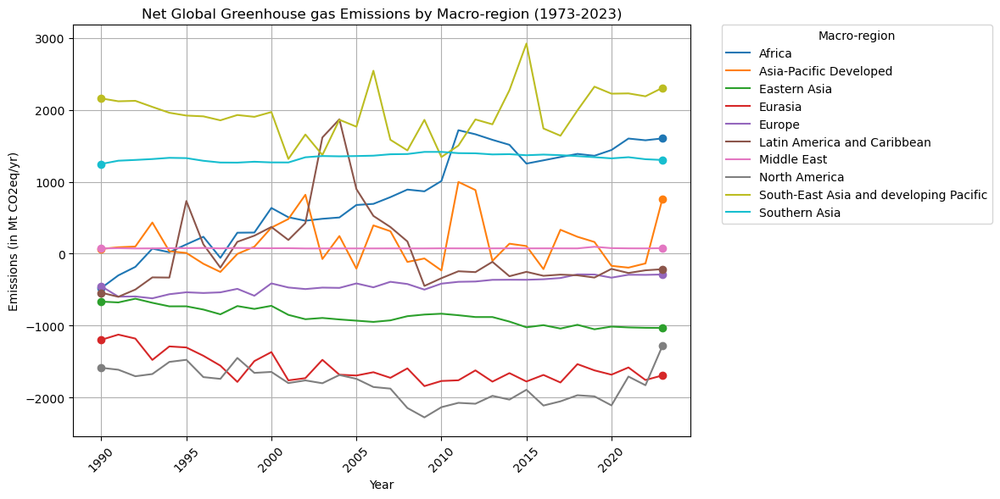

In [247]:
#Transpose
net_global_emissions_by_macroregions_map_transposed = net_global_emissions_by_macroregions_map.T

# Plotting the multi-line graph
plt.figure(figsize=(12, 6))  # Set the figure size
for sector in net_global_emissions_by_macroregions_map_transposed.columns:
    # Plot the line and get the color of the line
    line, = plt.plot(net_global_emissions_by_macroregions_map_transposed.index, 
                     net_global_emissions_by_macroregions_map_transposed[sector], 
                     label=sector)

    # Add markers for the first and last points with the same color as the line
    plt.plot(net_global_emissions_by_macroregions_map_transposed.index[0], 
             net_global_emissions_by_macroregions_map_transposed[sector].iloc[0], 
             'o', color=line.get_color())  # Dot for the first point
    plt.plot(net_global_emissions_by_macroregions_map_transposed.index[-1], 
             net_global_emissions_by_macroregions_map_transposed[sector].iloc[-1], 
             'o', color=line.get_color())  # Dot for the last point

# Customize the plot
plt.title('Net Global Greenhouse gas Emissions by Macro-region (1973-2023)')
plt.xlabel('Year')
plt.ylabel('Emissions (in Mt CO2eq/yr)')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability

# Position the legend outside the plot area
plt.legend(title='Macro-region', bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

plt.grid()
plt.tight_layout()  # Adjust layout to prevent clipping
plt.show()